# Inspect UKBB pipeline generated IDPs

### Data notes:

In [1]:
import numpy as np
import pandas as pd
import scipy as sc
import xarray as xr
import pingouin as pg

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms
import seaborn as sns
import plotly.express as px
import ptitprince as pt

from statsmodels.stats.multitest import fdrcorrection

import glob
import re
import os

sns.set_theme()
sns.set_context("paper")

## UKBB pipeline IDPs

In [2]:
# some useful dictonaries and lists
vendor_dict = {"TRI": "Siemens", "PRI": "Siemens", "ING": "Philips", "ACH": "Philips", "GEM": "GE", "GEP": "GE"}

scanner_dict = {"NOT1ACH": "Philips Achieva",
                "NOT2ING": "Philips Ingenia", 
                "NOT3GEM": "GE MR750",
                "NOT4GEP": "GE Premier", 
                "OXF1PRI": "Siemens Prisma 32",
                "OXF2PRI": "Siemens Prisma 64",
                "OXF3TRI": "Siemens Trio"}

scanner_code_dict = {"NOT1ACH": "Ach",
                        "NOT2ING": "Ing", 
                        "NOT3GEM": "750", 
                        "NOT3GEP": "Prem", 
                        "OXF1PRI": "Pri32",
                        "OXF2PRI": "Pri64",
                        "OXF3TRI": "Trio"}

fmriopt_dict = {"task-rest_acq-multiband4_bold": "Ing: MB4", # we want to keep the MB4 data
                "task-rest_acq-multiband6_bold": "Ing: MB6", 
                "task-rest_acq-resopt1_bold": "GE: 2.4iso",
                "task-rest_acq-resopt2_bold": "GE: 3.3iso", # we want to keep the 3.3mm data
                "task-rest_acq-resopt3_bold": "GE: 2.2x2.3x3.3"}

fmriopt_key_dict = {"task-rest_bold": "standard",
                    "task-rest_acq-multiband4_bold": "standard",
                    "task-rest_acq-multiband6_bold": "non-standard", 
                    "task-rest_acq-resopt1_bold": "non-standard",
                    "task-rest_acq-resopt2_bold": "standard", 
                    "task-rest_acq-resopt3_bold": "non-standard"} # standard are used for analyses

# the session info headers
fmri_info_hdrs = ['fmriopt_key', 'fmriopt', 'fmri_modality', 'fmri_spacing_tr', 
                   'fmri_spacing_x', 'fmri_spacing_y', 'fmri_spacing_z', 'fmri_size_t', 'fmri_scan_time']

basic_info_hdrs = ['session', 'scanner_name', 'vendor', 'scanner_code', 'scanner_software_version',
             'scanner_type', 'scanner_typeloc', 'scan_session_num', 'scan_session', 'subject']

info_hdrs = basic_info_hdrs + fmri_info_hdrs

##### IQM headers
# the T1w IQMs
anat_iqm_hdrs = ['T1w_fwhm_avg', 'T1w_fwhm_x', 'T1w_fwhm_y', 'T1w_fwhm_z', 
               'T1w_snr_total', 'T1w_snr_gm', 'T1w_snr_wm', 'T1w_snr_csf', 
               'T1w_snrd_total', 'T1w_snrd_gm', 'T1w_snrd_wm', 'T1w_snrd_csf', 
               'T1w_qi_1', 'T1w_cnr', 'T1w_cjv', 'T1w_efc']

# the fMRI IQMs (first 3 are UKBB measures)
fmri_iqm_hdrs = ['rfMRI_head_motion', 'rfMRI_TSNR', 'rfMRI_cleaned_TSNR', 'fmri_fwhm_avg',
                'fmri_fwhm_x', 'fmri_fwhm_y', 'fmri_fwhm_z', 
                 'fmri_effective_snr', 'fmri_effective_tsnr', 'fmri_etSNR/Pri',
                 'fmri_efc', 'fmri_fd_mean', 'fmri_fd_perc', 'fmri_aor', 'fmri_aqi']# , 'fmri_fber']

# the dMRI IQMs - excluding the higher shell QC measures (as GE is single-shell)
dmri_iqm_hdrs = ['dMRI_eddy_outlier', 'dMRI_qc_cnr_avg_1', 'dMRI_qc_cnr_avg_2',
       'dMRI_qc_cnr_std_1', 'dMRI_qc_cnr_std_2',
       'dMRI_qc_outliers_b_1',
       'dMRI_qc_outliers_pe_1', 'dMRI_qc_mot_abs', 'dMRI_qc_mot_rel',
       'dMRI_qc_outliers_tot']

all_dmri_iqm_hdrs = ['dMRI_eddy_outlier', 'dMRI_qc_cnr_avg_1', 'dMRI_qc_cnr_avg_2',
       'dMRI_qc_cnr_avg_3', 'dMRI_qc_cnr_std_1', 'dMRI_qc_cnr_std_2',
       'dMRI_qc_cnr_std_3', 'dMRI_qc_outliers_b_1', 'dMRI_qc_outliers_b_2',
       'dMRI_qc_outliers_pe_1', 'dMRI_qc_mot_abs', 'dMRI_qc_mot_rel',
       'dMRI_qc_outliers_tot']

# all IQM headers
iqm_hdrs = anat_iqm_hdrs + fmri_iqm_hdrs + dmri_iqm_hdrs



In [3]:
# FacetGrid heatmap function
def draw_heatmap(*args, **kwargs):
    data = kwargs.pop('data')
    d = data.pivot_table(index=args[1], columns=args[0], values=args[2])
    sns.heatmap(d, **kwargs)
    
def get_tri_annots(df, side='upper'):
    if side == 'upper':
        mask = np.triu(np.ones_like(df, dtype=bool), 1)
    elif side == 'lower':
        mask = np.tril(np.ones_like(df, dtype=bool), 1)
    
    labels = df.values.copy().round(3)
    labels[~mask] = np.nan
    annotations = labels.astype(str)
    annotations[np.isnan(labels)] = ""
    return annotations

def get_measure_type(measure_names, IDP=True):
    measure_type = []
    if IDP == True:
        for l in measure_names:
            if 'dMRI_TBSS' in l:
                measure_type = measure_type + [re.search('dMRI_(.*)_[0-9]+', l).group(1).replace('TBSS', 'dMRI ROI')]
            elif 'dMRI_xtract' in l:
                measure_type = measure_type + [re.search('dMRI_(.*)_[0-9]+', l).group(1).replace('xtract', 'dMRI tract')]
            elif 'T1_SIENAX' in l:
                measure_type = measure_type + ['FSL Tissue volumes']
            elif 'T1_GM_parcellation' in l:
                measure_type = measure_type + ['FSL GM volumes']
            elif 'T1_FIRST' in l:
                measure_type = measure_type + ['FSL Subcortical volumes']
            elif 'freesurfer' in l:
                if 'aseg' in l:
                    measure_type = measure_type + ['FreeSurfer Subcortical volumes']
                elif 'DK' in l:
                    if 'SurfArea' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical surface area (DK)']
                    elif 'GrayVol' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical volume (DK)'] 
                    elif 'ThickAvg' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical thickness (DK)']
                    elif 'MeanCurv' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical curvature (DK)']
                elif 'a2009s' in l:
                    if 'SurfArea' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical surface area (Destrieux)']
                    elif 'GrayVol' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical volume (Destrieux)'] 
                    elif 'ThickAvg' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical thickness (Destrieux)']
                    elif 'MeanCurv' in l:
                        measure_type = measure_type + ['FreeSurfer Cortical curvature (Destrieux)']                    
            elif 'T2_FLAIR' in l:
                measure_type = measure_type + ['WM hyperintensities']
            elif 'SWI_T2star' in l:
                measure_type = measure_type + ['SWI T2* subcortex']    
            elif 'rfMRI_d25' in l:
                if 'odeAmplitude' in l:
                    measure_type = measure_type + ['rfMRI d=25 node amplitudes']
                elif 'corr' in l:
                    measure_type = measure_type + ['rfMRI d=25 connectivities']
            elif 'rfMRI_d100' in l:
                if 'odeAmplitude' in l:
                    measure_type = measure_type + ['rfMRI d=100 node amplitudes']
                elif 'corr' in l:
                    measure_type = measure_type + ['rfMRI d=100 connectivities']   
            else:
                measure_type = measure_type + ["other"]
    elif IDP == False:
        for l in measure_names:
            if 'dMRI' in l:        
                measure_type = measure_type + ['dMRI']
            elif 'T1w' in l:
                measure_type = measure_type + ['T1'] 
            elif 'T2' in l:
                measure_type = measure_type + ['T2']
            elif 'SWI' in l:
                measure_type = measure_type + ['SWI'] 
            elif 'fmri' in l:
                measure_type = measure_type + ['fMRI']
            elif 'rfMRI' in l:
                measure_type = measure_type + ['fMRI']
                
    measure_type = [l.replace('_', ' ') for l in measure_type]
    measure_type = [l.replace('v1', ' ') for l in measure_type]
    return measure_type

def get_stats(df):
    mn = df.mean(axis=0).abs()
    std = df.std(axis=0).abs()
    med = df.median(axis=0).abs()
    mad = (df - df.mean()).abs().mean()
    mad_med = mad/med
    cv = std/mn
    return mn, med, mad, cv, mad_med

def get_null_corr(figobj, nsamp1=10, nsamp2=6, niter=1000):
    nullcorr = np.zeros((niter,))
    for i in range(0, niter):
        nullcorr[i] = sc.stats.spearmanr(np.random.choice(range(nsamp1), nsamp1, replace=False), 
                           np.random.choice(range(nsamp1), nsamp1, replace=False), axis=1)[0]
        
    null_iqr = np.percentile(nullcorr, [25, 75])
    
    if hasattr(figobj, 'get_xlim'):
        xlims = figobj.get_xlim()[0], figobj.get_xlim()[1]
        ylims = figobj.get_ylim()[0], figobj.get_ylim()[1]
        figobj.fill_between([xlims[0]-1, xlims[1]+1], null_iqr[0], null_iqr[1], color='red', alpha=0.2)
        figobj.set_xlim(xlims[0], xlims[1])
        figobj.set_ylim(0, ylims[1])
    else:
        ylims = figobj.axes[0][0].get_ylim()[0], figobj.axes[0][0].get_ylim()[1]
        
        for ax in figobj.axes[0]:
            xlims = ax.get_xlim()[0], ax.get_xlim()[1]
            ax.fill_between([xlims[0]-1, xlims[1]+1], null_iqr[0], null_iqr[1], color='red', alpha=0.2)
            ax.set_xlim(xlims[0], xlims[1])
            
        g.set(ylim=(ylims[0], ylims[1]))


## Build main dataframe

#### Load UKBB pipeline data

In [4]:
studydir = '/Users/shaunwarrington/OneDrive - The University of Nottingham (1)/Deliverables/Papers/NHarmony'
fig_out = f'{studydir}/pyfigs'

# Load IDP headers
hdrs = np.loadtxt(f'{studydir}/data/headers.txt', 'str')
hdrs = np.concatenate([['session'], hdrs])
hdrs = [x for x in hdrs if 'mist' not in x] # not using MIST

# Load subject-wise IDPs
idp_files = glob.glob(f'{studydir}/data/IDPs/*[!denoise].txt')
df = [pd.read_csv(f, sep=" ", index_col=None, header=None) for f in idp_files]
df = pd.concat(df, ignore_index=True)

df.columns = hdrs
df = df[df.columns.drop(list(df.filter(regex='tfMRI')))] # drop task-fMRI IDPs

print(f'{df.shape[0]} sessions')
print('The raw measures:')
df.head(5)

99 sessions
The raw measures:


,session,1_l_align_to_std_diff,1_nl_align_to_std_diff,1_nl_align_to_std_warp,1_inverse_SNR,1_inverse_CNR,2_FLAIR_align_to_T1,MRI_align_to_T1,WI_align_to_T1,fMRI_align_to_T1,...,T1_GM_parcellation_L_VIIIb_Cerebellum_vol,T1_GM_parcellation_Vermis_VIIIb_Cerebellum_vol,T1_GM_parcellation_R_VIIIb_Cerebellum_vol,T1_GM_parcellation_L_IX_Cerebellum_vol,T1_GM_parcellation_Vermis_IX_Cerebellum_vol,T1_GM_parcellation_R_IX_Cerebellum_vol,T1_GM_parcellation_L_X_Cerebellum_vol,T1_GM_parcellation_Vermis_X_Cerebellum_vol,T1_GM_parcellation_R_X_Cerebellum_vol,T2_FLAIR_WMH_volume
0,03997_NOT2ING001,0.709639,0.565298,0.068010,0.023000,0.048365,0.417115,0.817849,0.398544,0.896350,...,2109.992313,329.589582,2049.580686,1162.600140,208.419435,1462.600181,578.780475,222.489944,442.430170,1293
1,14229_NOT2ING001,0.709498,0.558609,0.074845,0.023515,0.050278,0.332084,0.655481,0.396900,0.954145,...,2143.709358,353.850084,2574.299187,1158.141840,299.850408,1511.128623,575.468728,228.350319,631.039500,2118
2,10975_OXF1PRI001,0.671640,0.532363,0.060674,0.014329,0.029774,0.506442,0.606848,0.408396,0.862284,...,2109.548870,282.620293,2201.957280,1493.439980,277.000116,1541.828000,463.729077,230.000078,399.809908,89
3,13192_OXF2PRI001,0.751898,0.578664,0.066386,0.014678,0.031013,0.467204,0.739697,0.509247,0.966793,...,2340.322330,324.540300,1955.638035,1420.989965,309.450327,1752.868617,464.880968,175.439902,432.559840,594
4,03286_OXF2PRI001,0.779914,0.612624,0.075811,0.015209,0.034127,0.489486,0.624702,0.491941,0.867948,...,2426.239281,318.269952,2279.822940,1753.326639,419.030611,1997.429920,563.281340,239.979695,533.270100,4638


#### Get the header descriptions

In [5]:
hdr_descriptions = pd.read_csv(f'{studydir}/data/hdr_descriptions.txt', sep="\r\t", names=['desc'])
hdr_descriptions["hdr"] = np.loadtxt(f'{studydir}/data/headers.txt', 'str')
                                     
hdr_descriptions = hdr_descriptions[hdr_descriptions["hdr"].str.contains("tfMRI")==False]
hdr_descriptions = hdr_descriptions[hdr_descriptions["hdr"].str.contains("mist")==False]

def hdr_desc(hdr):
    try:
        desc = hdr_descriptions.loc[hdr_descriptions.hdr == hdr, 'desc'].values[0]
    except:
        desc = hdr
    return desc


/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/1054213702.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  hdr_descriptions = pd.read_csv(f'{studydir}/data/hdr_descriptions.txt', sep="\r\t", names=['desc'])


#### Load and merge the fMRI IDPs

In [6]:
# these have whitespace sep
fmri_getlist = ['rfMRI_d100_NodeAmplitudes_v1', 'rfMRI_d100_partialcorr_v1', 'rfMRI_d25_fullcorr_v1', 
                'rfMRI_d100_fullcorr_v1', 'rfMRI_d25_NodeAmplitudes_v1', 'rfMRI_d25_partialcorr_v1']

df_fmri_idps = pd.DataFrame()
for l in fmri_getlist:
    idp_files = glob.glob(f'{studydir}/data/fmri_IDPs/*{l}.txt')
    tempdf = [pd.read_csv(f, sep='\s+', index_col=None, header=None) for f in idp_files]
    tempdf = pd.concat(tempdf, ignore_index=True)
    tempdf = tempdf.add_prefix(f'{l}_')
    tempdf.insert(0, 'session', [re.search('fmri_IDPs/(.*)_rfMRI', s).group(1) for s in idp_files])
    tempdf.sort_values(by='session', ignore_index=True, inplace=True)
    tempdf.drop('session', axis=1, inplace=True)
    df_fmri_idps = pd.concat((df_fmri_idps, tempdf), axis=1)

# _nodeAmplitudes.txt have "," sep
fmri_getlist = ['rfMRI_d100_nodeAmplitudes', 'rfMRI_d25_nodeAmplitudes']
for l in fmri_getlist:
    idp_files = glob.glob(f'{studydir}/data/fmri_IDPs/*{l}.txt')
    tempdf = [pd.read_csv(f, sep=',', index_col=None, header=None) for f in idp_files]
    tempdf = pd.concat(tempdf, ignore_index=True)
    tempdf = tempdf.add_prefix(f'{l}_')
    tempdf.insert(0, 'session', [re.search('fmri_IDPs/(.*)_rfMRI', s).group(1) for s in idp_files])
    tempdf.sort_values(by='session', ignore_index=True, inplace=True)
    tempdf.drop('session', axis=1, inplace=True)
    df_fmri_idps = pd.concat((df_fmri_idps, tempdf), axis=1)
    
# add session column
idp_files = glob.glob(f'{studydir}/data/fmri_IDPs/*{fmri_getlist[0]}.txt')
sesspd = pd.DataFrame({"session": [re.search('fmri_IDPs/(.*)_rfMRI', s).group(1) for s in idp_files]})
sesspd.sort_values(by='session', ignore_index=True, inplace=True)
df_fmri_idps["session"] = sesspd.values

# merge
df = pd.merge(df, df_fmri_idps, on="session", how="left")

#### Load MRIqc IQMs and add the effective SNR, CNR and tSNR

In [7]:
###### anat (T1 and T2) IQMs
df_anat = pd.read_csv(f'{studydir}/data/mriqc_anat_IQMs', sep=" ", index_col=None)

# separate T1w and T2w
df_t1 = df_anat[df_anat.modality == 'T1w']
df_t1 = df_t1.drop('modality', axis=1)
df_t1 = df_t1.add_prefix('T1w_')
df_t1.rename(columns={"T1w_session": "session"}, inplace=True)

df_t2 = df_anat[df_anat.modality == 'T2w']
df_t2 = df_t2.drop('modality', axis=1)
df_t2 = df_t2.add_prefix('T2w_')
df_t2.rename(columns={"T2w_session": "session"}, inplace=True)


###### func IQMs
df_func = pd.read_csv(f'{studydir}/data/mriqc_func_IQMs', sep=" ", index_col=None)

# re-name 'task-rest_acq-multiband6_bold' 'task-rest_acq-resopt1_bold' ' task-rest_acq-resopt3_bold' as 002
# now we can simply remove sessions 002 for fmri opts
idx = df_func.index[df_func.modality.isin(['task-rest_acq-multiband6_bold', 
                                               'task-rest_acq-resopt1_bold', 'task-rest_acq-resopt3_bold'])]
for i in idx:
    df_func.loc[i, 'session'] = df_func.loc[i, 'session'].replace('001', '002')

# add fMRI option keys
df_func.insert(1, 'fmriopt', df_func['modality'].map(fmriopt_dict))                                 
df_func.insert(1, 'fmriopt_key', df_func['modality'].map(fmriopt_key_dict))

# add effective SNR (correcting voxel size)
snr = df_func.filter(items=['snr'], axis=1)
snr = snr.divide(df_func.spacing_x * df_func.spacing_y * df_func.spacing_z, axis=0)
snr = snr.add_prefix('effective_')
df_func = pd.concat((df_func, snr), axis=1)

# and tSNR (correcting for number of volumes)
df_func['effective_tsnr'] = df_func['tsnr']*np.sqrt(df_func['size_t'])

# scan time (TR*nvols)
df_func['scan_time'] = df_func['size_t']*df_func['spacing_tr']

# tSNR * sqrt(nvolsPri * TRPri / TR)
TRPri = 0.735 # approx.
nvolPri = 490 # approx.
factPri = nvolPri*TRPri
df_func['etSNR/Pri'] = df_func['tsnr']*np.sqrt(factPri/df_func['spacing_tr'])

df_func = df_func.add_prefix('fmri_')
df_func.rename(columns={"fmri_session": "session",
                          "fmri_fmriopt_key": "fmriopt_key",
                          "fmri_fmriopt": "fmriopt"
                         }, inplace=True)

###### dMRI IQMs
idp_files = glob.glob(f'{studydir}/data/eddy_dmri_IQMs/*[!denoise].txt')
df_dmri = [pd.read_csv(f, sep=" ", index_col=None) for f in idp_files]
df_dmri = pd.concat(df_dmri, ignore_index=True)
df_dmri = df_dmri.drop('modality', axis=1)
df_dmri = df_dmri.add_prefix('dMRI_')
df_dmri.rename(columns={"dMRI_session": "session"}, inplace=True)


#### Load FreeSurfer IDPs - aseg lh.aparc.DKTatlas rh.aparc.DKTatlas lh.aparc.a2009s rh.aparc.a2009s

In [8]:
###### aseg
measure_name = 'aseg'
idp_files = glob.glob(f'{studydir}/data/freesurfer_stats/{measure_name}/*')
tempdf = pd.DataFrame()
for f in idp_files:
    d = pd.read_csv(f, sep="\s+", index_col=None)
    d['session'] = os.path.basename(f)
    tempdf = pd.concat((tempdf, d), ignore_index=True)
    
# get volumes
val_cols = ['Volume_mm3']
tempdf = tempdf[['StructName', 'session'] + val_cols]
tempdf = tempdf.pivot(index='session', columns='StructName', values=val_cols)
tempdf.columns = ['_'.join(col).strip() for col in tempdf.columns.values]
tempdf.reset_index(inplace=True, drop=False)

# drop WM measures
tempdf = tempdf[tempdf.columns.drop(list(tempdf.filter(regex='WM-')))]

# add prefix
tempdf = tempdf.add_prefix(f'freesurfer_{measure_name}_')
tempdf.rename(columns={f'freesurfer_{measure_name}_session': 'session'}, inplace=True)

# build FreeSurfer dataframe
df_fs = tempdf.copy()

###### aparc cortical atlases
for measure_name in ['lh.aparc.DKTatlas', 'rh.aparc.DKTatlas', 'lh.aparc.a2009s', 'rh.aparc.a2009s']:
    idp_files = glob.glob(f'{studydir}/data/freesurfer_stats/{measure_name}/*')
    tempdf = pd.DataFrame()
    for f in idp_files:
        d = pd.read_csv(f, sep="\s+", index_col=None)
        d['session'] = os.path.basename(f)
        tempdf = pd.concat((tempdf, d), ignore_index=True)

    # get StructName, SurfArea, GrayVol, ThickAvg, MeanCurv
    val_cols = ['SurfArea', 'GrayVol', 'ThickAvg', 'MeanCurv']
    tempdf = tempdf[['StructName', 'session'] + val_cols]
    tempdf = tempdf.pivot(index='session', columns='StructName', values=val_cols)
    tempdf.columns = ['_'.join(col).strip() for col in tempdf.columns.values]
    tempdf.reset_index(inplace=True, drop=False)

    # add prefix
    tempdf = tempdf.add_prefix(f'freesurfer_{measure_name}_')
    tempdf.rename(columns={f'freesurfer_{measure_name}_session': 'session'}, inplace=True)

    df_fs = pd.merge(df_fs, tempdf, on="session")

# for aseg, only keep subcortical
for h in ['Vent', 'CSF', 'CC', 'choroid-plexus', 'vessel', 'Optic-Chiasm', 'Cerebellum']:
    df_fs = df_fs[df_fs.columns.drop(list(df_fs.filter(regex=h)))]


# some NaNs/0s in the following, so remove
df_fs.drop(['freesurfer_rh.aparc.DKTatlas_SurfArea_temporalpole', 
            'freesurfer_rh.aparc.DKTatlas_GrayVol_temporalpole', 
            'freesurfer_rh.aparc.DKTatlas_ThickAvg_temporalpole', 
            'freesurfer_rh.aparc.DKTatlas_MeanCurv_temporalpole'
           ], axis=1, inplace=True)


#### Merge the anatomical, functional and diffusion IQMs to the main dataframe

In [9]:
# the IQM/QC dataframe
df = pd.merge(df, df_t1, on="session", how="left")
df = pd.merge(df, df_func, on="session", how="left")
df = pd.merge(df, df_dmri, on="session", how="left")

# merge the FreeSurfer IDPs
df = pd.merge(df, df_fs, on="session", how="left")


#### Drop unwanted IDPs

In [10]:
# T2 WM hyperintensities
df.drop(labels='T2_FLAIR_WMH_volume', axis=1, inplace=True)

# fMRI d=100
df = df[df.columns.drop(list(df.filter(regex='rfMRI_d100')))]

# dMRI NODDI (GE doesn't have higher b-vals)
df = df[df.columns.drop(list(df.filter(regex='dMRI_.*_ISOVF')))]
df = df[df.columns.drop(list(df.filter(regex='dMRI_.*_ICVF')))]
df = df[df.columns.drop(list(df.filter(regex='dMRI_.*_OD')))]


#### Add session info columns

In [11]:
sublist = [t.split('_')[0] for t in df.session.values]
scan_session = [t.split('_')[1] for t in df.session.values]
scan_session_num = [t[-3:] for t in scan_session]
scanner_typeloc = [t.split('00')[0] for t in scan_session]
scanner_type = [t[-3:] for t in scanner_typeloc]

df.insert(1, 'subject', sublist)
df.insert(1, 'scan_session', scan_session)
df.insert(1, 'scan_session_num', scan_session_num)
df.insert(1, 'scanner_typeloc', scanner_typeloc)
df.insert(1, 'scanner_type', scanner_type)
df.insert(1, 'vendor', df['scanner_type'].map(vendor_dict))
df.insert(1, 'scanner_name', df['scanner_typeloc'].map(scanner_dict))
df.insert(1, 'scanner_code', df['scanner_typeloc'].map(scanner_code_dict))

df.insert(1, 'scanner_software_version', '')
df.loc[df['scanner_code'] == '750', 'scanner_software_version'] = 'GE\nDV 24.0'
df.loc[df['scanner_code'] == 'Pri32', 'scanner_software_version'] = 'Prisma 32\nSyngo MR E11'
df.loc[df['scanner_code'] == 'Pri64', 'scanner_software_version'] = 'Prisma 64\nSyngo MR E11'
df.loc[df['scanner_code'] == 'Trio', 'scanner_software_version'] = 'Trio\nSyngo B17'

sublist_soft1 = ['03286', '03997', '13192', '13305', '14229', '14230']
sublist_soft2 = ['10975', '12813', '14221', '14482']
df.loc[(df['scanner_code'] == 'Ach') & (df['subject'].isin(sublist_soft1)), 'scanner_software_version'] = 'Achieva\n5.3.0.3'
df.loc[(df['scanner_code'] == 'Ach') & (df['subject'].isin(sublist_soft2)), 'scanner_software_version'] = 'Achieva\n5.6.1.1'
df.loc[(df['scanner_code'] == 'Ing') & (df['subject'].isin(sublist_soft1)), 'scanner_software_version'] = 'Ingenia\n5.3.1.0'
df.loc[(df['scanner_code'] == 'Ing') & (df['subject'].isin(sublist_soft2)), 'scanner_software_version'] = 'Ingenia\n5.6.1.0'


df.sort_values('session', inplace=True, ignore_index=True)
df.columns = df.columns.str.strip()

In [12]:
df

,session,scanner_software_version,scanner_code,scanner_name,vendor,scanner_type,scanner_typeloc,scan_session_num,scan_session,subject,...,freesurfer_rh.aparc.a2009s_MeanCurv_S_parieto_occipital,freesurfer_rh.aparc.a2009s_MeanCurv_S_pericallosal,freesurfer_rh.aparc.a2009s_MeanCurv_S_postcentral,freesurfer_rh.aparc.a2009s_MeanCurv_S_precentral-inf-part,freesurfer_rh.aparc.a2009s_MeanCurv_S_precentral-sup-part,freesurfer_rh.aparc.a2009s_MeanCurv_S_suborbital,freesurfer_rh.aparc.a2009s_MeanCurv_S_subparietal,freesurfer_rh.aparc.a2009s_MeanCurv_S_temporal_inf,freesurfer_rh.aparc.a2009s_MeanCurv_S_temporal_sup,freesurfer_rh.aparc.a2009s_MeanCurv_S_temporal_transverse
0,03286_NOT1ACH001,Achieva\n5.3.0.3,Ach,Philips Achieva,Philips,ACH,NOT1ACH,001,NOT1ACH001,03286,...,0.105,0.109,0.090,0.092,0.082,0.116,0.099,0.108,0.098,0.137
1,03286_NOT2ING001,Ingenia\n5.3.1.0,Ing,Philips Ingenia,Philips,ING,NOT2ING,001,NOT2ING001,03286,...,0.104,0.114,0.085,0.089,0.079,0.118,0.098,0.107,0.098,0.142
2,03286_NOT2ING002,Ingenia\n5.3.1.0,Ing,Philips Ingenia,Philips,ING,NOT2ING,002,NOT2ING002,03286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,03286_NOT3GEM001,GE\nDV 24.0,750,GE MR750,GE,GEM,NOT3GEM,001,NOT3GEM001,03286,...,0.102,0.111,0.090,0.093,0.084,0.113,0.099,0.104,0.100,0.143
4,03286_NOT3GEM002,GE\nDV 24.0,750,GE MR750,GE,GEM,NOT3GEM,002,NOT3GEM002,03286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,14482_NOT3GEM001,GE\nDV 24.0,750,GE MR750,GE,GEM,NOT3GEM,001,NOT3GEM001,14482,...,0.114,0.115,0.105,0.091,0.106,0.101,0.096,0.116,0.106,0.119
96,14482_NOT3GEM002,GE\nDV 24.0,750,GE MR750,GE,GEM,NOT3GEM,002,NOT3GEM002,14482,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,14482_OXF1PRI001,Prisma 32\nSyngo MR E11,Pri32,Siemens Prisma 32,Siemens,PRI,OXF1PRI,001,OXF1PRI001,14482,...,0.124,0.127,0.104,0.093,0.108,0.122,0.102,0.126,0.107,0.122
98,14482_OXF2PRI001,Prisma 64\nSyngo MR E11,Pri64,Siemens Prisma 64,Siemens,PRI,OXF2PRI,001,OXF2PRI001,14482,...,0.124,0.128,0.106,0.093,0.106,0.116,0.103,0.122,0.109,0.112


#### separate subjects with fmriopts

In [13]:
df_fmriopts = df.loc[(df['scan_session_num'] == '002') & 
                     (df['scanner_type'].isin(['GEM', 'ING']))]
df_fmriopts_idx = df_fmriopts.index.values # indices to remove from main df
df.drop(index=(df_fmriopts_idx), inplace=True) # remove from main df

# get alternative fMRI version data
grab = [s.replace('002', '001') for s in df_fmriopts.session.values]
df_fmriopts = pd.concat((df_fmriopts, df[df.session.isin(grab)]))
df_fmriopts.sort_values('session', inplace=True, ignore_index=True)

print(f'{df_fmriopts.shape[0]} sessions')
print('The fMRI-opt measures:')
df_fmriopts.head(5)

39 sessions
The fMRI-opt measures:


,session,scanner_software_version,scanner_code,scanner_name,vendor,scanner_type,scanner_typeloc,scan_session_num,scan_session,subject,...,freesurfer_rh.aparc.a2009s_MeanCurv_S_parieto_occipital,freesurfer_rh.aparc.a2009s_MeanCurv_S_pericallosal,freesurfer_rh.aparc.a2009s_MeanCurv_S_postcentral,freesurfer_rh.aparc.a2009s_MeanCurv_S_precentral-inf-part,freesurfer_rh.aparc.a2009s_MeanCurv_S_precentral-sup-part,freesurfer_rh.aparc.a2009s_MeanCurv_S_suborbital,freesurfer_rh.aparc.a2009s_MeanCurv_S_subparietal,freesurfer_rh.aparc.a2009s_MeanCurv_S_temporal_inf,freesurfer_rh.aparc.a2009s_MeanCurv_S_temporal_sup,freesurfer_rh.aparc.a2009s_MeanCurv_S_temporal_transverse
0,03286_NOT2ING001,Ingenia\n5.3.1.0,Ing,Philips Ingenia,Philips,ING,NOT2ING,001,NOT2ING001,03286,...,0.104,0.114,0.085,0.089,0.079,0.118,0.098,0.107,0.098,0.142
1,03286_NOT2ING002,Ingenia\n5.3.1.0,Ing,Philips Ingenia,Philips,ING,NOT2ING,002,NOT2ING002,03286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,03286_NOT3GEM001,GE\nDV 24.0,750,GE MR750,GE,GEM,NOT3GEM,001,NOT3GEM001,03286,...,0.102,0.111,0.090,0.093,0.084,0.113,0.099,0.104,0.100,0.143
3,03286_NOT3GEM002,GE\nDV 24.0,750,GE MR750,GE,GEM,NOT3GEM,002,NOT3GEM002,03286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,03286_NOT3GEM002,GE\nDV 24.0,750,GE MR750,GE,GEM,NOT3GEM,002,NOT3GEM002,03286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Get Tri, Pri32, Pri64 and Ach fMRI measures for comparison

In [14]:
# for all 001 sessions in df_fmriopts, get the corresponding data for the other scanners
df_fmriopts_comp = df[df.scan_session.isin(['NOT1ACH001', 'OXF1PRI001', 'OXF2PRI001', 'OXF3TRI001'])].copy()

df_fmriopts_comp.fmriopt = df_fmriopts_comp.scanner_code.values # replace fmriopt with Scanner code

df_fmriopts = pd.concat((df_fmriopts, df_fmriopts_comp))


#### Manual fix of 14230_NOT1ACH001 GM volumes

In [15]:
# after T1_GM_parcellation_Vermis_Crus_I_Cerebellum_vol in 14230_NOT1ACH001, values are incorrect
# T1_GM_parcellation_Vermis_Crus_I_Cerebellum_vol is missing and returns "missing label:" rather than values
# this throws off the awk, which feeds to multiplication with bc, and therefore performs the wrong calculation

# manually fix this 
idp_hdrs = list(df.filter(regex='T1_').columns.values)
ind = idp_hdrs.index('T1_GM_parcellation_Vermis_Crus_I_Cerebellum_vol')
hdrs_replace = idp_hdrs[ind:]

newvals = np.array([[0, 0],
                   [0.575510, 18538],
                   [0.531252, 14219],
                   [0.660524, 458],
                   [0.510263, 13543],
                   [0.576694, 6663],
                   [0.740000, 156],
                   [0.511343, 5936],
                   [0.483337, 7452],
                   [0.490643, 1306],
                   [0.481907, 6486],
                   [0.436989, 5954],
                   [0.536384, 614],
                   [0.397254, 7366],
                   [0.388458, 4215],
                   [0.315826, 860],
                   [0.381237, 5709],
                   [0.260741, 1647],
                   [0.423785, 362],
                   [0.240589, 1766]])
newvals = newvals[:,0]*newvals[:,1]

df.loc[df.session == '14230_NOT1ACH001', hdrs_replace] = newvals

#### Useful main data (df) lists

In [16]:
df.sort_values('session', inplace=True, ignore_index=True)

# subject, vendor and scanner lists
sub_list = df.subject.unique()
ven_list = df.vendor.unique()
scanner_typeloc_list = df.scanner_typeloc.unique()
scanner_type_list = df.scanner_type.unique()

reptlist = [["13192", "OXF1PRI"],
            ["14229", "OXF2PRI"],
            ["14230", "OXF3TRI"],
            ["14482", "NOT1ACH"]]

print(f'{len(sub_list)} subjects')
print(f'{len(ven_list)} vendors')
print(f'{len(scanner_typeloc_list)} scanners')
print(f'{len(scanner_type_list)} scanner types')


10 subjects
3 vendors
6 scanners
5 scanner types


### IQM variability across scanners (averaged across subjects)

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2866698719.py:65: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  fig = sns.heatmap(ave_iqm.groupby('SCANNER NAME').mean().T, cmap='coolwarm',


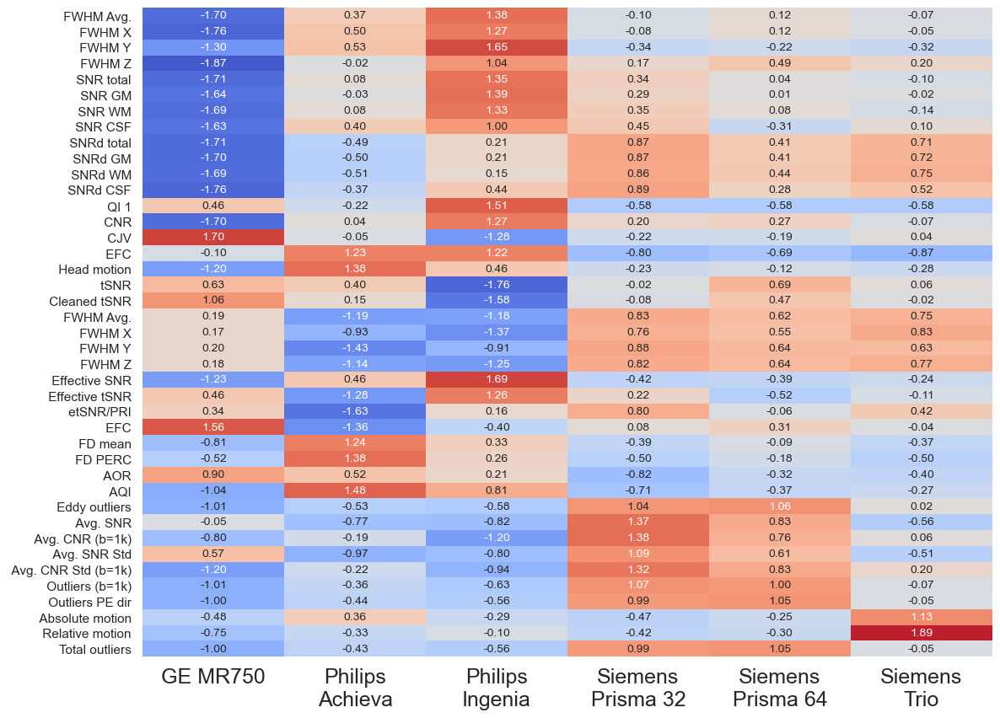

In [17]:
def prep_hdr_for_vis(df):
    df = df.rename(columns=lambda name: name.upper())
    df = df.rename(columns=lambda name: name.replace('_', ' '))
    df = df.rename(columns=lambda name: name.replace('RFMRI', ''))
    df = df.rename(columns=lambda name: name.replace('FMRI', ''))
    df = df.rename(columns=lambda name: name.replace('DMRI', ''))
    df = df.rename(columns=lambda name: name.replace('T1W', ''))
    
    df = df.rename(columns=lambda name: name.replace('EDDY OUTLIER', 'Eddy outliers'))
    df = df.rename(columns=lambda name: name.replace('HEAD', 'head'))
    df = df.rename(columns=lambda name: name.replace('MOTION', 'motion'))
    df = df.rename(columns=lambda name: name.replace('AVG', 'Avg.'))
    df = df.rename(columns=lambda name: name.replace('TOTAL', 'total'))
    df = df.rename(columns=lambda name: name.replace('CLEANED', 'cleaned'))
    df = df.rename(columns=lambda name: name.replace('MEAN', 'mean'))
    df = df.rename(columns=lambda name: name.replace('EFFECTIVE', 'Effective'))
    df = df.rename(columns=lambda name: name.replace('SNRD', 'SNRd'))
    df = df.rename(columns=lambda name: name.replace('ETSNR', 'etSNR'))
    df = df.rename(columns=lambda name: name.replace('TSNR', 'tSNR'))
    df = df.rename(columns=lambda name: name.replace('QC CNR Avg. 1', 'Avg. SNR'))
    df = df.rename(columns=lambda name: name.replace('QC CNR Avg. 2', 'Avg. CNR (b=1k)'))
    df = df.rename(columns=lambda name: name.replace('QC CNR Avg. 3', 'Avg. CNR (b=2k)'))
    df = df.rename(columns=lambda name: name.replace('QC CNR STD 1', 'Avg. SNR Std'))
    df = df.rename(columns=lambda name: name.replace('QC CNR STD 2', 'Avg. CNR Std (b=1k)'))
    df = df.rename(columns=lambda name: name.replace('QC CNR STD 3', 'Avg. CNR Std (b=2k)'))
    df = df.rename(columns=lambda name: name.replace('OUTLIERS TOT', 'Total outliers'))
    df = df.rename(columns=lambda name: name.replace('OUTLIERS', 'Outliers'))
    df = df.rename(columns=lambda name: name.replace('B 1', '(b=1k)'))
    df = df.rename(columns=lambda name: name.replace('B 2', '(b=2k)'))
    df = df.rename(columns=lambda name: name.replace('PE 1', 'PE dir'))
    df = df.rename(columns=lambda name: name.replace('MOT ABS', 'Absolute motion'))
    df = df.rename(columns=lambda name: name.replace('MOT REL', 'Relative motion'))
    df = df.rename(columns=lambda name: name.replace('QC ', ''))
    df = df.rename(columns=lambda name: name.replace('head', 'Head'))
    df = df.rename(columns=lambda name: name.replace('cleaned', 'Cleaned'))
    return df

# for each subject:
#  1. extract IQMs for all scanners
#  2. z-score across scanners
#  3. average scores across subjects

# iterate through sub_list
ave_iqm = pd.DataFrame()
for i,s in enumerate(sub_list):
    tempdf = df[(df.subject == s) & (df.scan_session_num == '001')]
    tempdf = tempdf[iqm_hdrs]
    tempdf = (tempdf - tempdf.mean())/tempdf.std()
    ave_iqm = pd.concat([ave_iqm, tempdf])
    

# set column names for nice plotting
ave_iqm[info_hdrs] = df[info_hdrs]
ave_iqm = ave_iqm[ave_iqm.columns.drop(list(ave_iqm.filter(regex='spacing|size')))]
ave_iqm.drop('fmri_scan_time', axis=1, inplace=True)
ave_iqm = prep_hdr_for_vis(ave_iqm)
ave_iqm.loc[ave_iqm['SCANNER NAME'].str.contains('Ingenia'), 'SCANNER NAME'] = 'Philips\nIngenia'
ave_iqm.loc[ave_iqm['SCANNER NAME'].str.contains('Achieva'), 'SCANNER NAME'] = 'Philips\nAchieva'
ave_iqm.loc[ave_iqm['SCANNER NAME'].str.contains('Prisma 32'), 'SCANNER NAME'] = 'Siemens\nPrisma 32'
ave_iqm.loc[ave_iqm['SCANNER NAME'].str.contains('Prisma 64'), 'SCANNER NAME'] = 'Siemens\nPrisma 64'
ave_iqm.loc[ave_iqm['SCANNER NAME'].str.contains('Trio'), 'SCANNER NAME'] = 'Siemens\nTrio'

sns.set(font_scale=1)
plt.figure(figsize=(13,10))
fig = sns.heatmap(ave_iqm.groupby('SCANNER NAME').mean().T, cmap='coolwarm',
            linewidths=.0, vmin=-2, vmax=2, annot=True, fmt='.2f', annot_kws={"fontsize": 10},
                  cbar=False,
            cbar_kws={"shrink": 0.5, "format": "%.f", "ticks": [-2, 0, 2]}
                 )

fig.set(xlabel=None)
fig.set_xticklabels(fig.get_xticklabels(), size=18)
plt.savefig(f'{fig_out}/scanner-wise_iqmvar.png', dpi=500, bbox_inches='tight')

In [18]:
m = ave_iqm.groupby('SCANNER NAME').mean().T

print('Number outside 1 STD per group')
print(np.sum(np.abs(m) > 1))

print('% outside 1 STD per group')
print((np.sum(np.abs(m) > 1)/m.shape[0])*100)

print(f'Within 1 STD: {(1 - np.sum((np.sum(np.abs(m) > 1).values))/(m.shape[0] * m.shape[1]))*100:.0f}%')

Number outside 1 STD per group
SCANNER NAME
GE MR750              24
Philips\nAchieva      11
Philips\nIngenia      19
Siemens\nPrisma 32     6
Siemens\nPrisma 64     3
Siemens\nTrio          2
dtype: int64
% outside 1 STD per group
SCANNER NAME
GE MR750              58.536585
Philips\nAchieva      26.829268
Philips\nIngenia      46.341463
Siemens\nPrisma 32    14.634146
Siemens\nPrisma 64     7.317073
Siemens\nTrio          4.878049
dtype: float64
Within 1 STD: 74%


/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2239009567.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  m = ave_iqm.groupby('SCANNER NAME').mean().T


### IQM variability across scanners/software versions (averaged across subjects)

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/1968571874.py:28: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  fig = sns.heatmap(ave_iqm.groupby('SCANNER SOFTWARE VERSION').mean().T, cmap='coolwarm',


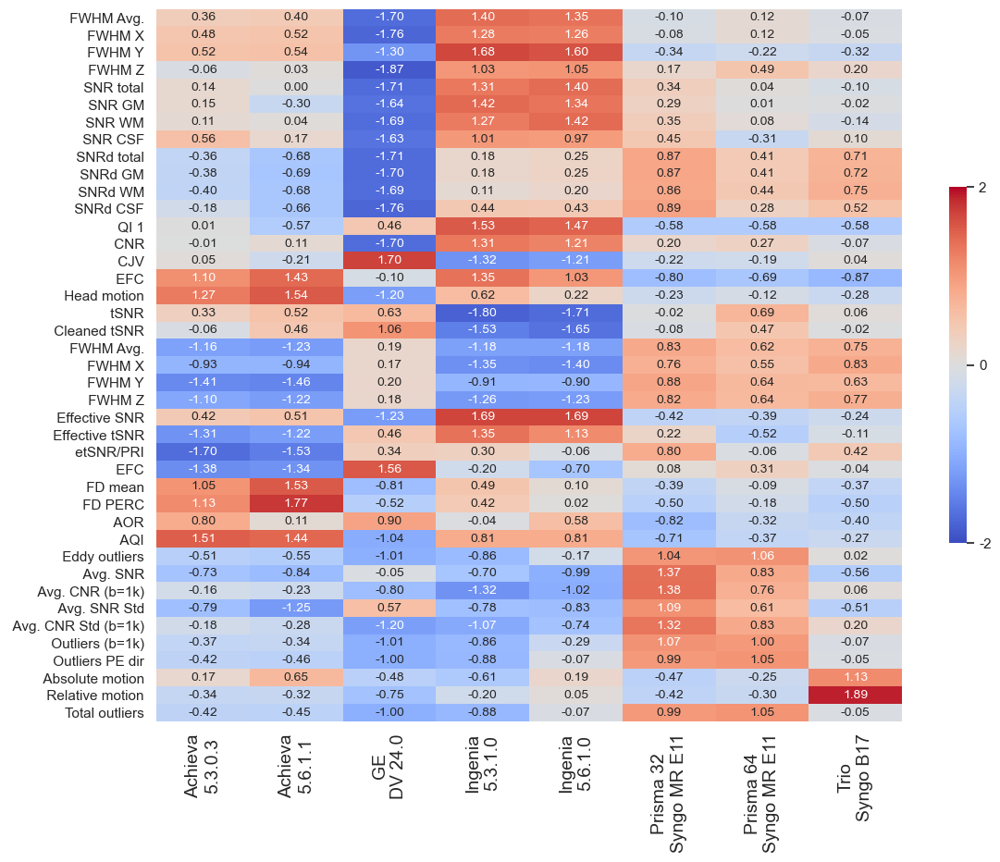

In [19]:
# for each subject:
#  1. extract IQMs for all scanners
#  2. z-score across scanners/software
#  3. average scores across subjects

# iterate through sub_list
ave_iqm = pd.DataFrame()
for i,s in enumerate(sub_list):
    tempdf = df[(df.subject == s) & (df.scan_session_num == '001')]
    tempdf = tempdf[iqm_hdrs]
    tempdf = (tempdf - tempdf.mean())/tempdf.std()
    ave_iqm = pd.concat([ave_iqm, tempdf])
    

# set column names for nice plotting
ave_iqm[info_hdrs] = df[info_hdrs]
ave_iqm = ave_iqm[ave_iqm.columns.drop(list(ave_iqm.filter(regex='spacing|size')))]
ave_iqm.drop('fmri_scan_time', axis=1, inplace=True)
ave_iqm = prep_hdr_for_vis(ave_iqm)
# ave_iqm.loc[ave_iqm['SCANNER SOFTWARE VERSION'].str.contains('Ingenia'), 'SCANNER SOFTWARE VERSION'] = 'Philips\nIngenia'
# ave_iqm.loc[ave_iqm['SCANNER SOFTWARE VERSION'].str.contains('Achieva'), 'SCANNER NAME'] = 'Philips\nAchieva'
# ave_iqm.loc[ave_iqm['SCANNER SOFTWARE VERSION'].str.contains('Prisma 32'), 'SCANNER SOFTWARE VERSION'] = 'Siemens\nPrisma 32'
# ave_iqm.loc[ave_iqm['SCANNER SOFTWARE VERSION'].str.contains('Prisma 64'), 'SCANNER SOFTWARE VERSION'] = 'Siemens\nPrisma 64'
# ave_iqm.loc[ave_iqm['SCANNER SOFTWARE VERSION'].str.contains('Trio'), 'SCANNER SOFTWARE VERSION'] = 'Siemens\nTrio'

sns.set(font_scale=1)
plt.figure(figsize=(13,10))
fig = sns.heatmap(ave_iqm.groupby('SCANNER SOFTWARE VERSION').mean().T, cmap='coolwarm',
            linewidths=.0, vmin=-2, vmax=2, annot=True, fmt='.2f', annot_kws={"fontsize": 10},
                  cbar=True,
            cbar_kws={"shrink": 0.5, "format": "%.f", "ticks": [-2, 0, 2]}
                 )

fig.set(xlabel=None)
fig.set_xticklabels(fig.get_xticklabels(), size=14)
plt.savefig(f'{fig_out}/scanner_software-wise_iqmvar.png', dpi=500, bbox_inches='tight')

### IQM variability across subjects (averaged across scanners)

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/1993606889.py:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  fig = sns.heatmap(ave_iqm.groupby('SUBJECT').mean().T, cmap='coolwarm',


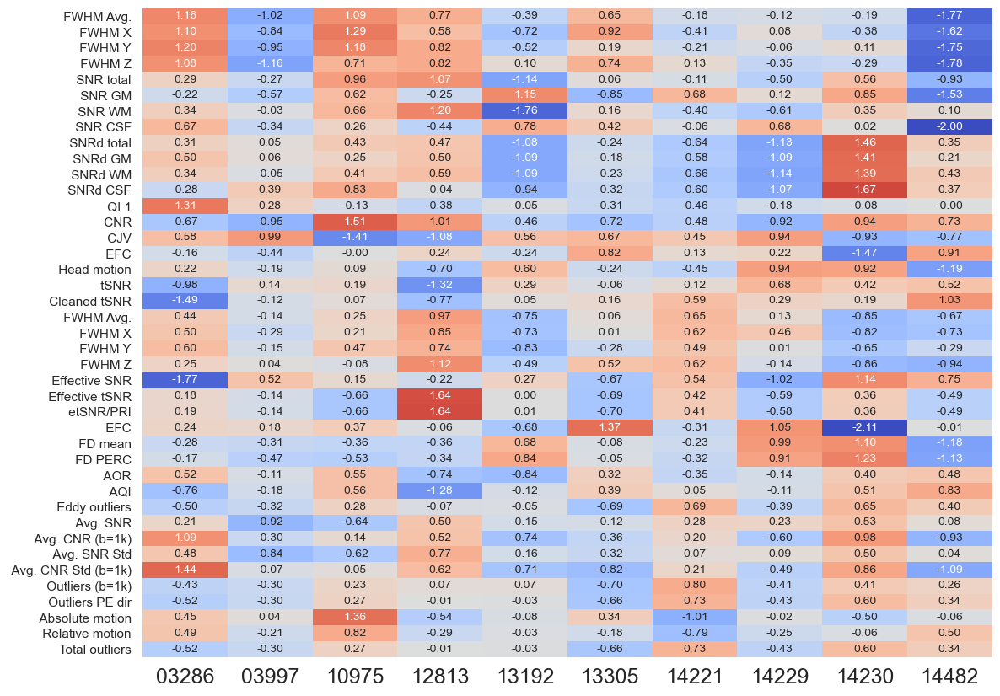

In [20]:
#  1. extract IQMs for all subjects for a given scanner
#  2. z-score across across subjects
#  3. average scores across scanners

ave_iqm = pd.DataFrame()
for i,s in enumerate(scanner_typeloc_list):
    tempdf = df[(df.scanner_typeloc == s) & (df.scan_session_num == '001')]
    tempdf = tempdf[iqm_hdrs]
    tempdf = (tempdf - tempdf.mean())/tempdf.std()
    ave_iqm = pd.concat([ave_iqm, tempdf])
    
ave_iqm[info_hdrs] = df[info_hdrs]
ave_iqm = ave_iqm[ave_iqm.columns.drop(list(ave_iqm.filter(regex='spacing|size')))]
ave_iqm.drop('fmri_scan_time', axis=1, inplace=True)
ave_iqm = prep_hdr_for_vis(ave_iqm)

plt.figure(figsize=(13,10))
fig = sns.heatmap(ave_iqm.groupby('SUBJECT').mean().T, cmap='coolwarm',
            linewidths=.0, vmin=-2, vmax=2, annot=True, fmt='.2f', annot_kws={"fontsize": 10},
                  cbar=False,
#             cbar_kws={"shrink": 0.5, "format": "%.f", "ticks": [-2, 0, 2]}
                 )

fig.set(xlabel=None)
fig.set_xticklabels(fig.get_xticklabels(), size=18)
# cbar = fig.collections[0].colorbar
# cbar.ax.tick_params(size=0)

plt.savefig(f'{fig_out}/subject-wise_iqmvar.png', dpi=500, bbox_inches='tight')

In [21]:
m = ave_iqm.groupby('SUBJECT').mean().T

print('Number outside 2 STD per group')
print(np.sum(np.abs(m) > 2))

print('% outside 2 STD per group')
print((np.sum(np.abs(m) > 2)/m.shape[0])*100)

print(f'Within 2 STD: {(1 - np.sum((np.sum(np.abs(m) > 2).values))/(m.shape[0] * m.shape[1]))*100:.2f}%')

Number outside 2 STD per group
SUBJECT
03286    0
03997    0
10975    0
12813    0
13192    0
13305    0
14221    0
14229    0
14230    1
14482    0
dtype: int64
% outside 2 STD per group
SUBJECT
03286    0.000000
03997    0.000000
10975    0.000000
12813    0.000000
13192    0.000000
13305    0.000000
14221    0.000000
14229    0.000000
14230    2.439024
14482    0.000000
dtype: float64
Within 2 STD: 99.76%


/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/260379152.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  m = ave_iqm.groupby('SUBJECT').mean().T


## Comparing IQMs across fMRI versions
#### GE versions: 2.4mm or 3.3mm isotropic data
#### Ingenia versions: multiband 4 or 6

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/1710138295.py:16: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  mn.drop('sorter', 1, inplace = True)
/Users/shaunwarrington/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/Users/shaunwarrington/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/Users/shaunwarrington/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/Users/shaunwarrington/.local/lib/python

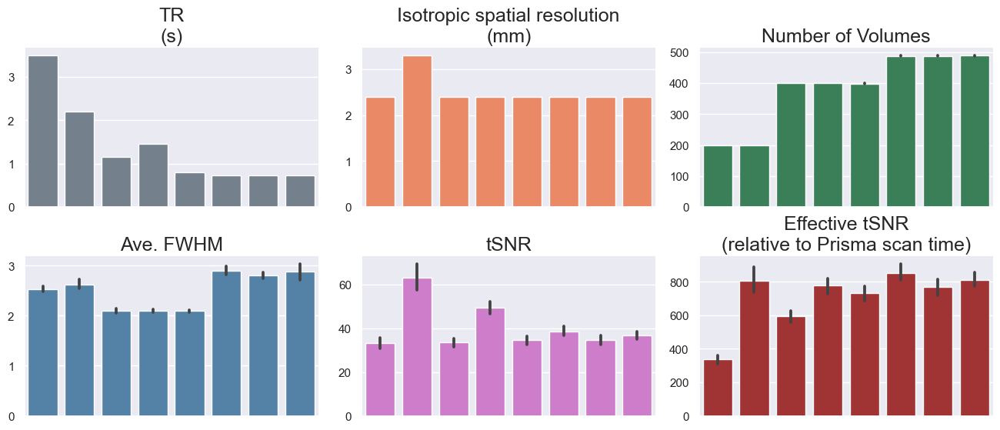

In [26]:
# for the abstract
sorter = ['fmri_spacing_tr', 'fmri_spacing_x', 'fmri_size_t',
          'fmri_fwhm_avg', 'fmri_tsnr', 'fmri_etSNR/Pri']
sorterIndex = dict(zip(sorter, range(len(sorter))))

order = [#'GE: 2.2x2.3x3.3', # this protocol version is only available in 1 subject
                 'GE: 2.4iso', 'GE: 3.3iso', 
                           'Ach', 'Ing: MB4', 'Ing: MB6', 'Pri32', 'Pri64', 'Trio']

mn = df_fmriopts[['fmriopt'] + sorter].copy()
mn = pd.melt(mn, id_vars='fmriopt', value_vars=mn.columns)

mn['sorter'] = mn['variable'].map(sorterIndex)
mn.sort_values(['sorter', 'fmriopt'],
        ascending = [True , True], inplace = True)
mn.drop('sorter', 1, inplace = True)

mn.replace('fmri_', '', regex=True, inplace=True)
mn.replace('_', ' ', regex=True, inplace=True)

mn.replace('spacing tr', 'TR\n(s)', regex=True, inplace=True)
mn.replace('spacing x', 'Isotropic spatial resolution\n(mm)', regex=True, inplace=True)
mn.replace('size t', 'Number of Volumes', regex=True, inplace=True)
mn.replace('fwhm avg', 'Ave. FWHM', regex=True, inplace=True)
mn.replace('snr', 'SNR', regex=True, inplace=True)
mn.replace('effective', 'Effective', regex=True, inplace=True)
mn.replace('etSNR/Pri', 'Effective tSNR\n(relative to Prisma scan time)', regex=True, inplace=True)

g = sns.FacetGrid(mn, col="variable", sharey=False, col_wrap=3, height=3, aspect=1.5, hue='variable', 
                  palette=["slategrey", "coral", "seagreen", "steelblue", "orchid", "firebrick"])
g.map(sns.barplot, 'fmriopt', 'value', order=order)

g.set_titles(col_template="{col_name}", size=18)
g.set_ylabels("")
g.set_xlabels("")
for axes in g.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=90)    

plt.savefig(f'{fig_out}/fmri_protocol_iqms.png', dpi=500, bbox_inches='tight')

## Select the 5% most reliable fMRI measures

In [27]:
# keep the 5% percent strongest connections
fmri_top5_idp_list = list(df.filter(regex='NodeAmplitudes_v1').columns.values)
for d in [25]: #, 100]:
    for meas in ['partialcorr']:#, 'fullcor']:
        idp_hdrs = list(df.filter(regex=f'rfMRI_d{d}_{meas}').columns.values)
        keepnum = int(np.round(0.05*len(idp_hdrs)))
        
        # calculate CoV across within-scanner repeats
        mean_edge = np.zeros(len(idp_hdrs))
        for sub, sca in reptlist:
            tempdf = df[(df.subject == sub) & (df.scanner_typeloc == sca)]
            mn,_,_,_,_ = get_stats(tempdf[idp_hdrs])
            mean_edge += mn.values
            
        mean_edge = mean_edge/len(reptlist)
        keeplist = [idp_hdrs[i] for i in np.argsort(mean_edge)[:keepnum]]
        fmri_top5_idp_list = fmri_top5_idp_list + keeplist
        

## Generate the all-session correlation matrices for IDPs

In [28]:
def plot_bigcorr(df, zscore=False, corrmethod='spearman', vlim=[], print_plot=True):
    reptdf = df.copy()
    reptdf_sort = pd.DataFrame()
    for s in reptdf.subject.unique():
        tempdf = reptdf[reptdf.subject == s].copy()
        if tempdf.scanner_code.value_counts().max() > 1:
            tempdf.sort_values('scan_session_num', inplace=True, ignore_index=True)
            rept_scanner = tempdf.scanner_code.value_counts().idxmax()
            tempdf = pd.concat([tempdf[tempdf.scanner_code != rept_scanner].sort_values('scan_session_num'),
                                tempdf[tempdf.scanner_code == rept_scanner]])

        reptdf_sort = pd.concat([reptdf_sort, tempdf], axis=0, ignore_index=True)

    tempdf = reptdf_sort.drop(info_hdrs, axis=1)
    if zscore == True:
        tempdf = (tempdf - tempdf.mean())/tempdf.std()

    # correlate
    dfcorr = tempdf.T.corr(corrmethod)
    dfcorr.columns = reptdf_sort.session
    dfcorr.index = reptdf_sort.session

    if print_plot == True:
        plt.figure(figsize=[25, 25])
        if vlim == []:
            g = sns.heatmap(dfcorr, linewidth=0.5, xticklabels=False, yticklabels=False, 
                            cbar_kws={'shrink': 0.2}, square=True, cmap='coolwarm')
        else:
            g = sns.heatmap(dfcorr, linewidth=0.5, xticklabels=False, yticklabels=False,
                    vmin=vlim[0], vmax=vlim[1], cbar_kws={'shrink': 0.4, "ticks": vlim}, square=True, cmap='coolwarm')

        for s in reptdf_sort.subject.unique():
            tempdf = reptdf_sort[reptdf_sort.subject == s].copy()
            subind = tempdf.index
            g.add_patch(Rectangle((subind[0], subind[0]), subind.shape[0], subind.shape[0], 
                                  fill=False, edgecolor='black', lw=8))

            rept_scanner = tempdf.scanner_code.value_counts()
            if rept_scanner.max() > 1:    
                rept_scanner = rept_scanner.idxmax()
                reptind = tempdf.index[tempdf.scanner_code == rept_scanner]

                g.add_patch(Rectangle((subind[0], subind[0]), reptind.shape[0], reptind.shape[0], 
                                      fill=False, edgecolor='seagreen', lw=8))

                g.add_patch(Rectangle((reptind[0], reptind[0]), reptind.shape[0], reptind.shape[0], 
                                      fill=False, edgecolor='steelblue', lw=8))

        sub_patch = mpatches.Patch(color='black', label='Within subject')
        across_patch = mpatches.Patch(color='seagreen', label='Within subject, between scanner')
        within_patch = mpatches.Patch(color='steelblue', label='Within subject, within scanner')
        plt.legend(handles=[sub_patch, across_patch, within_patch], loc=(1.0, 0.95), fontsize='large', frameon=False);
        plt.tick_params(axis='both', labelsize=10)
        cbar = g.collections[0].colorbar
        cbar.ax.tick_params(labelsize=24)
        plt.xlabel("")
        plt.ylabel("")
        
    np.fill_diagonal(dfcorr.values, np.nan)
    return dfcorr


### IDPs

In [29]:
## loop through IDP_types
IDP_groups = ['T1_SIENAX', 'T1_FIRST', 'SWI_T2star', 'T1_GM_parcellation',
#               'freesurfer_aseg', 
#               'freesurfer_lh.aparc.DKTatlas_SurfArea', 'freesurfer_rh.aparc.DKTatlas_SurfArea', 
#               'freesurfer_lh.aparc.DKTatlas_GrayVol', 'freesurfer_rh.aparc.DKTatlas_GrayVol', 
#               'freesurfer_lh.aparc.DKTatlas_ThickAvg', 'freesurfer_rh.aparc.DKTatlas_ThickAvg', 
#               'freesurfer_lh.aparc.DKTatlas_MeanCurv', 'freesurfer_rh.aparc.DKTatlas_MeanCurv', 
#               'freesurfer_lh.aparc.a2009s_SurfArea', 'freesurfer_rh.aparc.a2009s_SurfArea', 
#               'freesurfer_lh.aparc.a2009s_GrayVol', 'freesurfer_rh.aparc.a2009s_GrayVol', 
#               'freesurfer_lh.aparc.a2009s_ThickAvg', 'freesurfer_rh.aparc.a2009s_ThickAvg', 
#               'freesurfer_lh.aparc.a2009s_MeanCurv', 'freesurfer_rh.aparc.a2009s_MeanCurv', 
             'dMRI_TBSS_FA', 'dMRI_TBSS_MD', 'dMRI_TBSS_MO', 'dMRI_TBSS_L1', 'dMRI_TBSS_L2', 'dMRI_TBSS_L3',
#              'dMRI_TBSS_ICVF', 'dMRI_TBSS_OD', 'dMRI_TBSS_ISOVF', # exclude NODDI measures
             'dMRI_xtract_FA', 'dMRI_xtract_MD', 'dMRI_xtract_MO', 'dMRI_xtract_L1', 'dMRI_xtract_L2', 'dMRI_xtract_L3',
#              'dMRI_xtract_ICVF', 'dMRI_xtract_OD', 'dMRI_xtract_ISOVF', # exclude NODDI measures
#               'rfMRI_d100_NodeAmplitudes', 'rfMRI_d100_partialcorr',
              'rfMRI_d25_NodeAmplitudes', 'rfMRI_d25_partialcorr'
             ]



In [30]:
def bigcorr(df):
    reptdf = df.copy()
    reptdf_sort = pd.DataFrame()
    for s in reptdf.subject.unique():
        tempdf = reptdf[reptdf.subject == s].copy()
        if tempdf.scanner_code.value_counts().max() > 1:
            tempdf.sort_values('scan_session_num', inplace=True, ignore_index=True)
            rept_scanner = tempdf.scanner_code.value_counts().idxmax()
            tempdf = pd.concat([tempdf[tempdf.scanner_code != rept_scanner].sort_values('scan_session_num'),
                                tempdf[tempdf.scanner_code == rept_scanner]])

        reptdf_sort = pd.concat([reptdf_sort, tempdf], axis=0, ignore_index=True)

    tempdf = reptdf_sort.drop(info_hdrs, axis=1)

    # correlate
    dfcorr = tempdf.T.corr('spearman')
    dfcorr.columns = reptdf_sort.session
    dfcorr.index = reptdf_sort.session
    np.fill_diagonal(dfcorr.values, np.nan)
    return dfcorr, reptdf_sort, tempdf

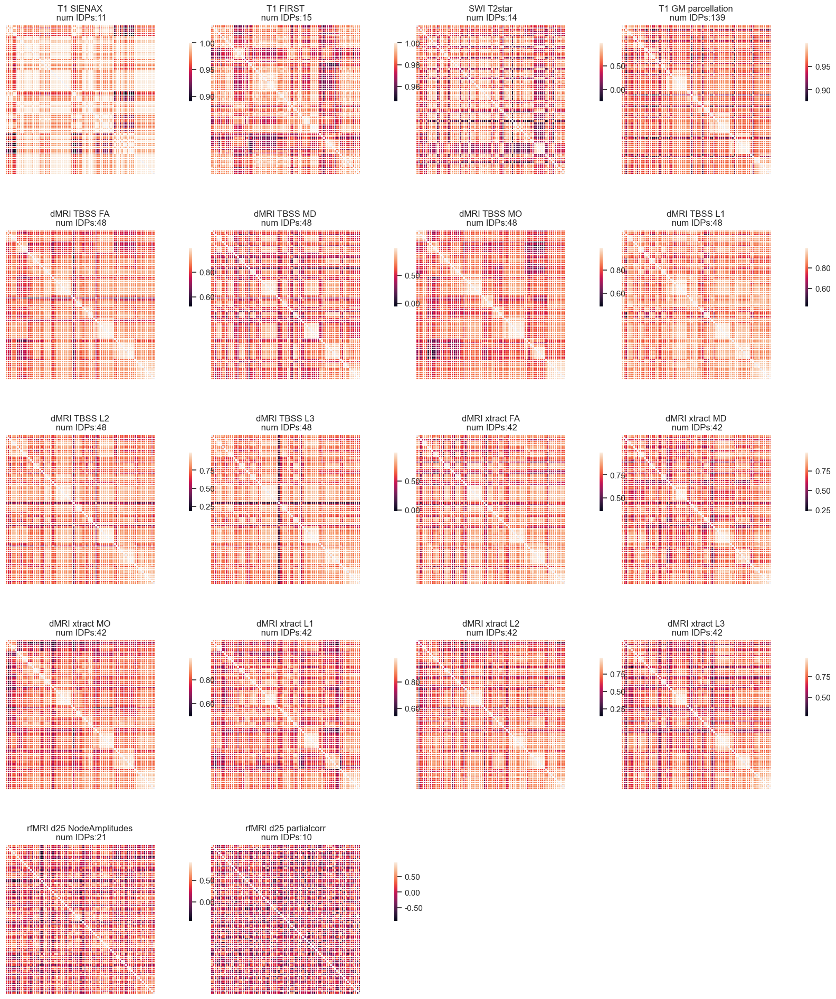

In [31]:
ncol = 4
nrow = int(np.ceil(len(IDP_groups) / ncol))
fig, axs = plt.subplots(nrows=nrow, ncols=ncol, figsize=(4*ncol, 4*nrow))

all_corrmat = np.zeros((df.shape[0], df.shape[0], len(IDP_groups)))
for i, (h, ax) in enumerate(zip(IDP_groups, axs.ravel())):
    if 'rfMRI' in h:
        idp_hdrs = [k for k in fmri_top5_idp_list if h in k]
    else:
        idp_hdrs = list(df.filter(regex=h).columns.values)
        
    corrmat, reptdf_sort, sorted_df = bigcorr(df[info_hdrs + idp_hdrs])

    g = sns.heatmap(corrmat, linewidth=0.5, xticklabels=False, yticklabels=False, #vmin=vmin, vmax=vmax,
                cbar=True, cbar_kws=dict(use_gridspec=True, location="right", format='%.2f',
                                         shrink=0.3, anchor=(1,0.7)), 
                    square=True, ax=ax)
    h = h.replace('_', ' ')
    h = h.replace('freesurfer', 'FreeSurfer')
    h = h.replace('aseg', 'subcortical')
    h = h.replace('lh.', 'LH ')
    h = h.replace('rh.', 'RH ')
    h = h.replace('aparc.DKTatlas', 'cortical (DK)\n')
    h = h.replace('aparc.a2009s', 'cortical (Destrieux)\n')
    
    h = h + '\n num IDPs:' + str(len(idp_hdrs))
    
    ax.title.set_text(h)
    g.set_xlabel('')
    g.set_ylabel('')
    
    all_corrmat[:, :, i] = corrmat.values
    
plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.05)

for i, ax in enumerate(axs.ravel()):
    if i >= len(IDP_groups):
        fig.delaxes(ax)

In [32]:
def plot_all_corr(plotxr, zlims=[]):
    if zlims == []:
        fig = px.imshow(plotxr, animation_frame='features', width=1000, aspect='equal',
                       labels=dict(animation_frame="features"), origin=[0, 0],
                       color_continuous_scale='inferno')
    else:
        fig = px.imshow(plotxr, animation_frame='features', width=1000, aspect='equal',
                       labels=dict(animation_frame="features"), origin=[0, 0], zmin=zlims[0], zmax=zlims[1],
                       color_continuous_scale='inferno')        

    fig.update_layout(xaxis_visible=False, xaxis_showticklabels=False,
                     yaxis_visible=False, yaxis_showticklabels=False,
                     margin=dict(l=10, r=10, t=10, b=10))
    fig.update(data=[{'customdata': ses_labels,
        'hovertemplate': "session X: %{customdata[0]}<br> session Y: %{customdata[1]}<br> corr: %{z}"}])

    reptdf = df.copy()
    reptdf_sort = pd.DataFrame()
    for s in reptdf.subject.unique():
        tempdf = reptdf[reptdf.subject == s].copy()
        if tempdf.scanner_code.value_counts().max() > 1:
            tempdf.sort_values('scan_session_num', inplace=True, ignore_index=True)
            rept_scanner = tempdf.scanner_code.value_counts().idxmax()
            tempdf = pd.concat([tempdf[tempdf.scanner_code != rept_scanner].sort_values('scan_session_num'),
                                tempdf[tempdf.scanner_code == rept_scanner]])

        reptdf_sort = pd.concat([reptdf_sort, tempdf], axis=0, ignore_index=True)

    for s in reptdf_sort.subject.unique():
        tempdf = reptdf_sort[reptdf_sort.subject == s].copy()
        subind = tempdf.index

        fig.add_shape(type="rect",
            x0=subind[0]-0.5, y0=subind[0]-0.5, x1=subind[-1]+0.5, y1=subind[-1]+0.5,
            line=dict(
                color="black",
                width=2,
            )
        )

        rept_scanner = tempdf.scanner_code.value_counts()
        if rept_scanner.max() > 1:    
            rept_scanner = rept_scanner.idxmax()
            reptind = tempdf.index[tempdf.scanner_code == rept_scanner]

            fig.add_shape(type="rect",
            x0=subind[0]-0.5, y0=subind[0]-0.5, x1=reptind[0]+0.5, y1=reptind[0]+0.5,
            line=dict(
                color="seagreen",
                width=2,
                    )
                )
            fig.add_shape(type="rect",
                        x0=reptind[0]-0.5, y0=reptind[0]-0.5, x1=reptind[-1]+0.5, y1=reptind[-1]+0.5,
                        line=dict(
                            color="steelblue",
                            width=2,
                                )
                            )        
    
    fig.show()
    fig.write_html(f'{studydir}/all_corrmats.html')

In [33]:
# plot all together
session1 = corrmat.index.values
session2 = corrmat.columns.values

# make array of session ids for customdata
ses_labels = [corrmat.index.values]*len(corrmat.index.values)
ses_labels = np.dstack((ses_labels, np.transpose([corrmat.columns.values]*len(corrmat.columns.values)) ))

plotxr = xr.DataArray(all_corrmat, 
        coords={'session1': session1,'session2': session2, 'features': IDP_groups}, 
        dims=["session1", "session2", "features"])

plot_all_corr(plotxr)

## Median of corrmats

/usr/local/fsl/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1119: RuntimeWarning:

All-NaN slice encountered



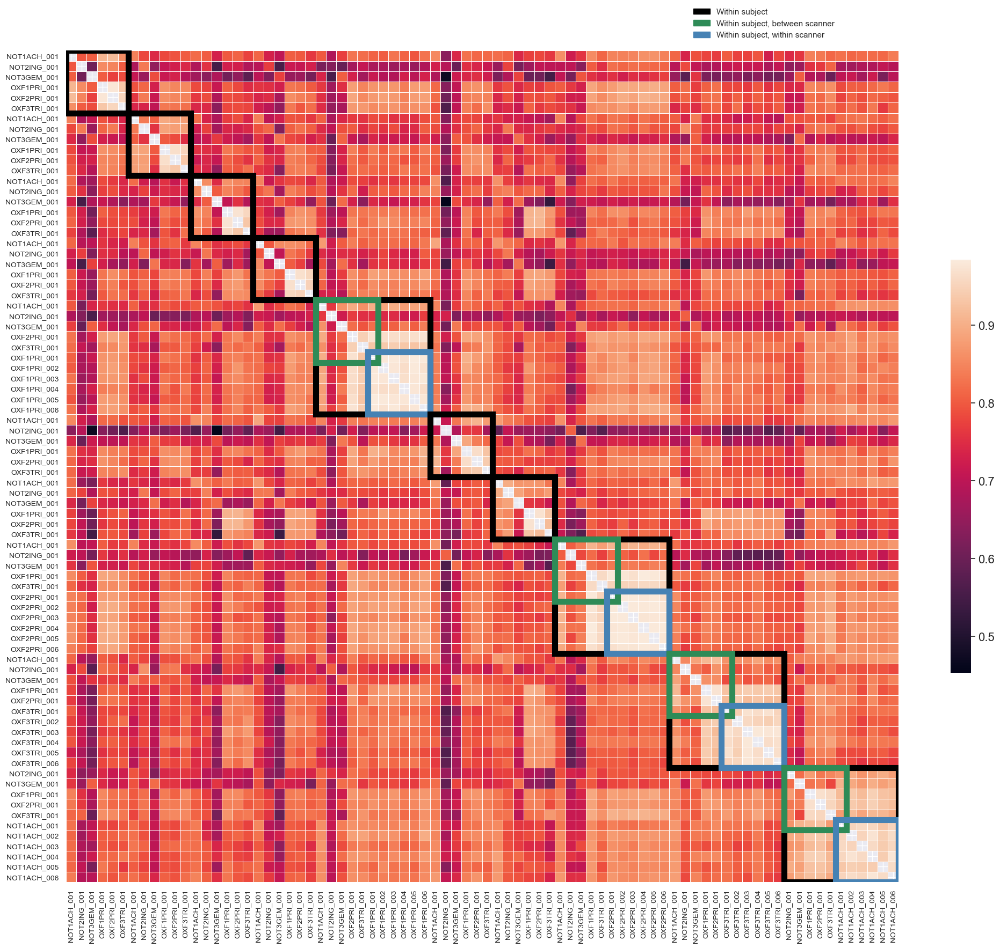

In [34]:
all_corrmat = pd.DataFrame(data=np.nanmedian(all_corrmat, axis=2), index=corrmat.index, columns=corrmat.columns)

fig, ax = plt.subplots(1, figsize=[25, 25])
g = sns.heatmap(all_corrmat, linewidth=0.5, xticklabels=True, yticklabels=True, 
                cbar_kws={'shrink': 0.4}, square=True)

for s in reptdf_sort.subject.unique():
    sorted_df = reptdf_sort[reptdf_sort.subject == s].copy()
    subind = sorted_df.index
    g.add_patch(Rectangle((subind[0], subind[0]), subind.shape[0], subind.shape[0], 
                          fill=False, edgecolor='black', lw=8))

    rept_scanner = sorted_df.scanner_code.value_counts()
    if rept_scanner.max() > 1:    
        rept_scanner = rept_scanner.idxmax()
        reptind = sorted_df.index[sorted_df.scanner_code == rept_scanner]

        g.add_patch(Rectangle((subind[0], subind[0]), reptind.shape[0], reptind.shape[0], 
                              fill=False, edgecolor='seagreen', lw=8))

        g.add_patch(Rectangle((reptind[0], reptind[0]), reptind.shape[0], reptind.shape[0], 
                              fill=False, edgecolor='steelblue', lw=8))

sub_patch = mpatches.Patch(color='black', label='Within subject')
across_patch = mpatches.Patch(color='seagreen', label='Within subject, between scanner')
within_patch = mpatches.Patch(color='steelblue', label='Within subject, within scanner')
plt.legend(handles=[sub_patch, across_patch, within_patch], loc=(0.75, 1.01), frameon=False);#, fontsize='large');
cbar = g.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)
plt.xlabel("")
plt.ylabel("")

# make tick labels
plt.tick_params(axis='both', labelsize=10)
tick_labels = [i.split('_')[1].replace('00', '_00') for i in all_corrmat.index]
g.set_xticklabels(tick_labels)
g.set_yticklabels(tick_labels)


plt.savefig(f'{fig_out}/all_corrmat_median.png', dpi=500, bbox_inches='tight')


## Plot corrmats for subject with within-scanner repeats

In [35]:
def dfcorr_grab(dfcorr, grablist):
    dfouta = pd.DataFrame()
    for s in grablist:
        tempdf = dfcorr.filter(regex=s, axis=0)
        dfouta = pd.concat((dfouta, tempdf), axis=0)

    dfoutb = pd.DataFrame()
    for s in grablist:
        tempdf = dfouta.filter(regex=s, axis=1)
        dfoutb = pd.concat((dfoutb, tempdf), axis=1)
        
    return dfoutb

def plot_rept_corr(fulldfcorr, active_list, subwise=True, vlim=[], box=True, col_wrap=2, annot=True):
    if col_wrap is not None:
        ncol = col_wrap
        nrow = int(np.ceil(len(active_list) / col_wrap))
    
    if subwise == False:
        box = False
    
    fig, axs = plt.subplots(nrows=nrow, ncols=ncol, figsize=(4*ncol, 4*nrow))
    cbar_ax = fig.add_axes([.91, .3, .02, .3])
    for i, (s, ax) in enumerate(zip(active_list, axs.ravel())):
        dfcorr = dfcorr_grab(fulldfcorr, [s])
        if subwise == True:        
            dfcorr.columns = dfcorr.columns.str.replace(f'{s}_', "")
            dfcorr.columns = dfcorr.columns.str.replace('00.*$', '', regex=True)
            dfcorr.index = dfcorr.index.str.replace(f'{s}_', "")
            dfcorr.index = dfcorr.index.str.replace('00.*$', '', regex=True)
            dfcorr.rename(columns=scanner_code_dict, index=scanner_code_dict, inplace=True)
        else:
            dfcorr.columns = dfcorr.columns.str.replace(f'_{s}', "")
            dfcorr.index = dfcorr.index.str.replace(f'_{s}', "")
            
            
        # plot correlation matrix
        annotations = get_tri_annots(dfcorr, side='upper')
        if annot == False:
            annotations = False
            
        if vlim == []:
            g = sns.heatmap(dfcorr, annot=annotations, annot_kws={"fontsize":8}, ax=ax, yticklabels=True,
                           fmt='s', linewidth=0.5, cbar=i == 0, cbar_ax=None if i else cbar_ax)
        else:
            g = sns.heatmap(dfcorr, annot=annotations, annot_kws={"fontsize":8}, ax=ax, yticklabels=True,
                           fmt='s', linewidth=0.5, vmin=vlim[0], vmax=vlim[1], cbar_kws={"ticks": [vlim[0], vlim[1]]},
                           cbar=i == 0, cbar_ax=None if i else cbar_ax)

        g.set_xticklabels('');
        g.set_xlabel('');
        g.set_ylabel('');
        
        
        
        if subwise == True: 
            ax.set_title(f'Subject {s}')
        else:
            s = re.sub('00.*$', '', s)
            ax.set_title(f'Scanner {scanner_code_dict[s]}')
            
        if box == True:
            # add square around within/across scanners
            ax.add_patch(Rectangle((0.05, 0.05), 6, 6, fill=False, edgecolor='seagreen', lw=6))
            ax.add_patch(Rectangle((5, 5), 5.95, 5.95, fill=False, edgecolor='steelblue', lw=6))

            
        # vectorise the upper triangle and define whether it is within or between subject/scanner
        boolmask = np.triu(np.ones(dfcorr.shape), 1).astype(bool)
        withmask = pd.DataFrame([i == dfcorr.columns for i in dfcorr.index])

        within = dfcorr.where(boolmask & withmask.values)
        within = within.reset_index()
        within = pd.melt(within, id_vars='session', value_vars=within.columns)
        within.columns.values[0] = "session1"
        within.columns.values[1] = "session2"
        within['type'] = "within"
        between = dfcorr.where(boolmask & ~withmask.values)
        between = between.reset_index()
        between = pd.melt(between, id_vars='session', value_vars=between.columns)
        between.columns.values[0] = "session1"
        between.columns.values[1] = "session2"
        between['type'] = "between"
        dfout = pd.concat((within, between)).dropna(axis=0)
            
    fig.subplots_adjust(wspace=0.3)
    if box == True:
        across_patch = mpatches.Patch(color='seagreen', label='Between scanner')
        within_patch = mpatches.Patch(color='steelblue', label='Within scanner')
        plt.legend(handles=[across_patch, within_patch], loc=(0.9, 1.8), fontsize='small', frameon=False)

    return dfcorr, dfout
    

In [36]:
def vec_corr(dfcorr):
    # vectorise the upper triangle and define whether it is within or between subject/scanner
    boolmask = np.triu(np.ones(dfcorr.shape), 1).astype(bool)
    withmask = pd.DataFrame([i == dfcorr.columns for i in dfcorr.index])
    
    dfcorr.index.name = 'session1'
    dfcorr.columns.name = 'session2'

    within = dfcorr.where(boolmask & withmask.values)
    within = within.reset_index()
    within = pd.melt(within, id_vars='session1', value_vars=within.columns)
    within['type'] = "within-scanner"
    
    between = dfcorr.where(boolmask & ~withmask.values)
    between = between.reset_index()
    between = pd.melt(between, id_vars='session1', value_vars=between.columns)
    between['type'] = "between-scanner"
    
    dfout = pd.concat((within, between)).dropna(axis=0)
    return dfout


### Zoomed subject/scanner wise correlation matrices

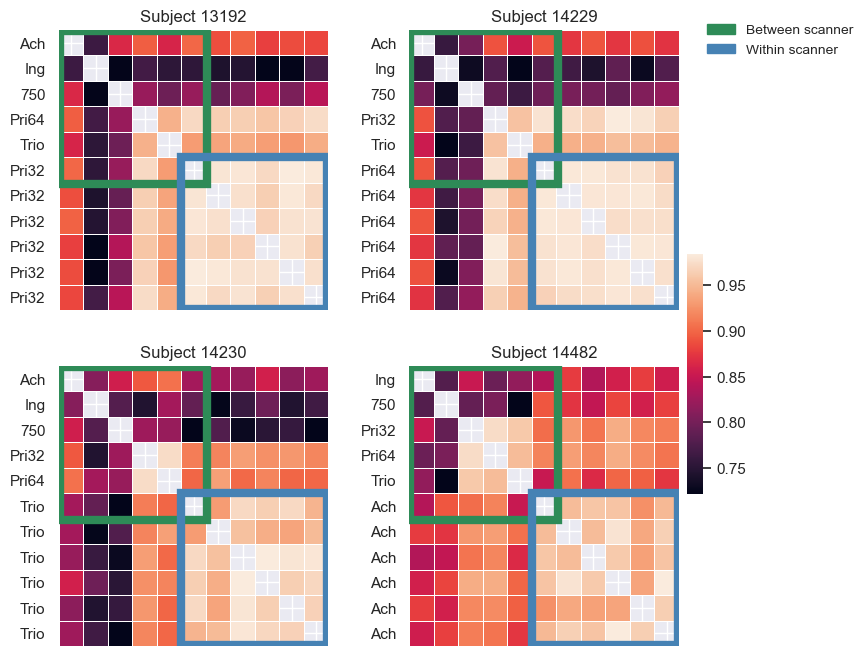

In [37]:
# subject-wise
_, corrmat = plot_rept_corr(all_corrmat, [i[0] for i in reptlist], annot=False)

plt.savefig(f'{fig_out}/repeat_sess_corr.png', dpi=500, bbox_inches='tight')


In [38]:
def plot_withinbetween(corrmat, scanner_list, subject_list, reptlist):
    plotdf = pd.DataFrame()
    
    # within scanner, between subject IDPs
    dfcorr = dfcorr_grab(corrmat, subject_list) 
    for s in scanner_list:
        temp = dfcorr.copy()
        temp = dfcorr_grab(temp, [s]) 
        temp.columns = temp.columns.str.replace(f'_{s}', '')
        temp.columns = temp.columns.str.replace('001', '')
        temp.index = temp.index.str.replace(f'_{s}', '')
        temp.index = temp.index.str.replace('001', '')
        temp = vec_corr(temp)

        temp['type'] = 'between subject\nwithin scanner'
        temp['scanner'] = s
        plotdf = pd.concat((plotdf, temp), axis=0)
    
    # between scanner, within subject IDPs
    dfcorr = dfcorr_grab(corrmat, scanner_list) 
    for s in subject_list:
        temp = dfcorr.copy()
        temp = dfcorr_grab(temp, [s]) 
        temp.columns = temp.columns.str.replace(f'{s}_', '')
        temp.columns = temp.columns.str.replace('001', '')
        temp.index = temp.index.str.replace(f'{s}_', '')
        temp.index = temp.index.str.replace('001', '')
        temp = vec_corr(temp)

        temp['type'] = 'within subject\nbetween scanner'
        temp['subject'] = s
        plotdf = pd.concat((plotdf, temp), axis=0)

    # within scanner, within subject IDPs
    for sub, scan in reptlist:
        dfcorr = dfcorr_grab(corrmat, [sub])
        dfcorr = dfcorr_grab(dfcorr, [scan])
        temp = dfcorr.copy()
        temp.columns = temp.columns.str.replace(f'{scan}', '')
        temp.index = temp.index.str.replace(f'{scan}', '')
        temp = vec_corr(temp)

        temp['type'] = 'within subject\nwithin scanner'
        temp['scanner'] = scan
        plotdf = pd.concat((plotdf, temp), axis=0)
    
    with sns.axes_style("dark"):
        sns.set(font_scale=1.5)
        p = ["lightcoral", "seagreen", "steelblue"]
        
        plt.figure(figsize=(8, 8))
        g = pt.RainCloud(data=plotdf, x='type', y="value", bw=0.5, cut=0, orient='v', palette=p)
        g.set(xlabel='', ylabel='Session similarity')
        
        
    return plotdf

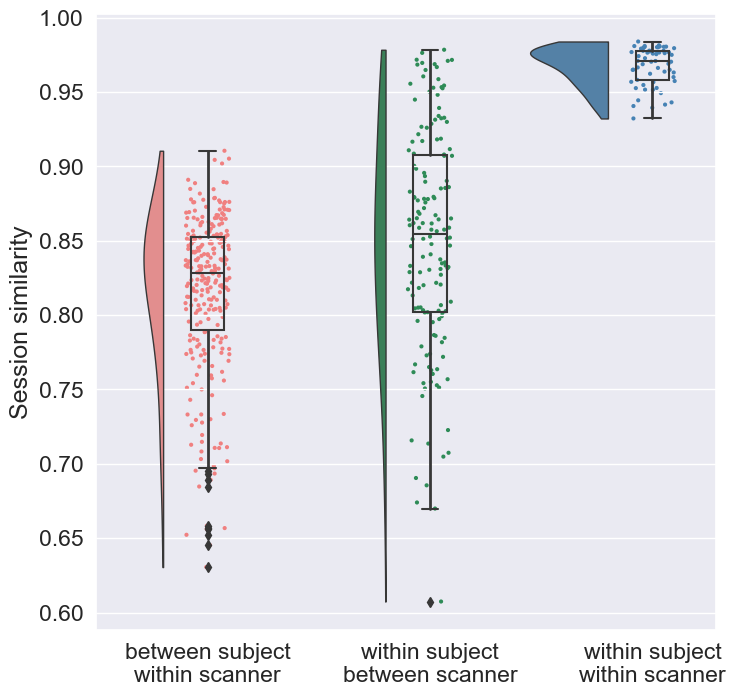

In [39]:
corrmat = plot_withinbetween(all_corrmat, [i + '001' for i in scanner_typeloc_list], sub_list, reptlist)

plt.savefig(f'{fig_out}/within_between_violins.png', dpi=500, bbox_inches='tight')


### Variance for raw data for comparison - modality wise explorations

In [40]:
def plot_man(df, title, info=True):
    plotdf = df.copy()
    fig = plt.figure(figsize=(16, 4))

    with sns.axes_style("dark"):
        g = sns.scatterplot(data=df, y="value", x="IDP", hue="IDP_type")
        g.set_xticklabels("");
        g.set_ylabel("Coefficient of Variation");
        g.set_xlabel("");
        g.set_title(title);
        g.axhline(0, linewidth=3, color='w', linestyle="--")
        g.legend(loc='upper right', bbox_to_anchor=(1.2, 1), fontsize=10, frameon=False)
        
        # draw lines to segment IDP_types
        section_list = plotdf.IDP_type.unique()
        plotdf.reset_index(inplace=True)
        g.axvline(0, linewidth=3, color='black', alpha=0.3, linestyle="--")
        for s in section_list:
            ind = plotdf[plotdf.IDP_type == s].index
            g.axvline(ind[-1], linewidth=3, color='black', alpha=0.3, linestyle="--")
            if info == True:
                plt.text(np.round(np.mean(ind)), -0.05, s, 
                         verticalalignment='top', horizontalalignment='center', 
                         rotation=90, size='small', color='black')

def plot_reldiff(raw, denoised):
    f = plt.figure(figsize=(16, 4))
    gs = f.add_gridspec(1, 2, width_ratios=[1, 4])

    ax = f.add_subplot(gs[0, 0])
    ax.axis('equal')
    ax.set_aspect('equal')
    g = sns.scatterplot(x=raw["value"].values, y=denoised["value"].values, 
                hue=denoised["IDP_type"].values, legend=False)
    g.set_xlabel("raw variability")
    g.set_ylabel("denoised variability")

    xlim = g.get_xlim()
    ylim = g.get_ylim()
    line = mlines.Line2D([-100, 100], [-100, 100], color='red')
    g.add_line(line)
    g.set_xlim(xlim[0], xlim[1])
    g.set_ylim(ylim[0], ylim[1])
    
    # difference
    diff = raw.copy()
    diff["relative difference"] = (raw["value"].values-denoised["value"].values)/raw["value"].values
    with sns.axes_style("dark"):
        ax = f.add_subplot(gs[0, 1])
        g = sns.scatterplot(data=diff, y="relative difference", x="IDP", hue="IDP_type")
        g.set_xticklabels("");
        g.legend(loc='upper right', bbox_to_anchor= (1.25,1), fontsize=10, frameon=False)
        g.axhline(0, linewidth=3, color='w', linestyle="--")
        
    plt.tight_layout()
    return diff

#### IDP-wise variance for each subject with repeats

In [41]:
idp_hdrs = list(df.filter(regex='T1_|T2_FLAIR|SWI_|aseg|DKTatlas|dMRI_TBSS|dMRI_xtract').columns.values)
idp_hdrs = idp_hdrs + fmri_top5_idp_list

# idp_hdrs = list(df.filter(regex='dMRI_TBSS').columns.values) # use this for the supplementary figure with NODDI measures


In [42]:
within_cov, between_cov, between_sub = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
for sub, sca in zip(["13192", "14229", "14230", "14482"], ["OXF1PRI", "OXF2PRI", "OXF3TRI", "NOT1ACH"]):
    # within-scanner 
    tempdf = df[(df.subject == sub) & (df.scanner_typeloc == sca)]
    mn, med, mad, cv, mad_med = get_stats(tempdf[idp_hdrs])
    measure_type = get_measure_type(cv.index)
    tempdf = pd.DataFrame({"subject": sub, "scanner": sca, "IDP": cv.index, "value": cv, "IDP_type": measure_type})
    within_cov = pd.concat((within_cov, tempdf))

for sub in sub_list:    
    # between-scanner
    tempdf = df[(df.subject == sub) & (df.scan_session_num == '001')]
    mn, med, mad, cv, mad_med = get_stats(tempdf[idp_hdrs])
    measure_type = get_measure_type(cv.index)
    tempdf = pd.DataFrame({"subject": sub, "IDP": cv.index, "value": cv, "IDP_type": measure_type})
    between_cov = pd.concat((between_cov, tempdf))
    
for sca in scanner_typeloc_list: 
    # between-subject
    tempdf = df[(df.scanner_typeloc == sca) & (df.scan_session_num == '001')]
    mn, med, mad, cv, mad_med = get_stats(tempdf[idp_hdrs])
    measure_type = get_measure_type(cv.index)
    tempdf = pd.DataFrame({"subject": 'all', 'scanner': sca, "IDP": cv.index, "value": cv, "IDP_type": measure_type})
    between_sub = pd.concat((between_sub, tempdf))   
    
# average across subjects
within_cov = within_cov.groupby('IDP').mean()
measure_type = get_measure_type(within_cov.index)
within_cov["IDP_type"] = measure_type

between_cov = between_cov.groupby('IDP').mean()
measure_type = get_measure_type(between_cov.index)
between_cov["IDP_type"] = measure_type

between_sub = between_sub.groupby('IDP').mean()
measure_type = get_measure_type(between_sub.index)
between_sub["IDP_type"] = measure_type


/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2502275201.py:27: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2502275201.py:31: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2502275201.py:35: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [43]:
# prepare for plotting
within_cov['repeat_type'] = 'within-scanner'
between_cov['repeat_type'] = 'between-scanner'
between_sub['repeat_type'] = 'between-subject'

# re-order to group modalities
def reorder_df(df):
    IDP_type_order = [
                        'FSL Tissue volumes', 'FSL Subcortical volumes', 'FSL GM volumes', 'SWI T2* subcortex',
                        'FreeSurfer Subcortical volumes',
                        'FreeSurfer Cortical surface area (DK)', 'FreeSurfer Cortical volume (DK)', 
                        'FreeSurfer Cortical thickness (DK)', 'FreeSurfer Cortical curvature (DK)',
                        'FreeSurfer Cortical surface area (Destrieux)', 'FreeSurfer Cortical volume (Destrieux)', 
                        'FreeSurfer Cortical thickness (Destrieux)', 'FreeSurfer Cortical curvature (Destrieux)',
                        'dMRI ROI FA', 'dMRI ROI MD', 'dMRI ROI MO',
                        'dMRI ROI L1', 'dMRI ROI L2', 'dMRI ROI L3',
                        'dMRI ROI ICVF', 'dMRI ROI OD', 'dMRI ROI ISOVF',
                        'dMRI tract FA', 'dMRI tract MD', 'dMRI tract MO',  
                        'dMRI tract L1', 'dMRI tract L2', 'dMRI tract L3',
                        'rfMRI d=25 node amplitudes', 'rfMRI d=25 connectivities'
                     ]
    tempdf = pd.DataFrame()
    for h in IDP_type_order:
        tempdf = pd.concat((tempdf, df[df.IDP_type == h]))
    
    return tempdf
    

covdf = pd.concat((reorder_df(within_cov), reorder_df(between_cov), reorder_df(between_sub)))

# replace names for display
covdf.replace({
                'FSL Tissue volumes': 'Tissue volumes (SIENAX)', 
               'FSL Subcortical volumes': 'Subcortical volumes (FIRST)', 
               'FSL GM volumes': 'Atlas-based cortical volumes',
               'FreeSurfer': '',
               'dMRI tract': 'Tractography ROI',
               'dMRI ROI': 'Atlas-based ROI',
               'rfMRI': ''
              }, regex=True, inplace=True)


In [44]:
def get_group_stats(df):
    for h in df.IDP_type.unique():
        mn = df[df.IDP_type == h].value.mean()
        std = df[df.IDP_type == h].value.std()
        med = df[df.IDP_type == h].value.median()
        q5 = df[df.IDP_type == h].value.quantile(q=0.05)
        q95 = df[df.IDP_type == h].value.quantile(q=0.95)
        df.loc[df.IDP_type == h, 'value'] = mn
        df.loc[df.IDP_type == h, 'std'] = std
        df.loc[df.IDP_type == h, 'median'] = med
        df.loc[df.IDP_type == h, 'quantile (5th)'] = q5
        df.loc[df.IDP_type == h, 'quantile (95th)'] = q95
    return df

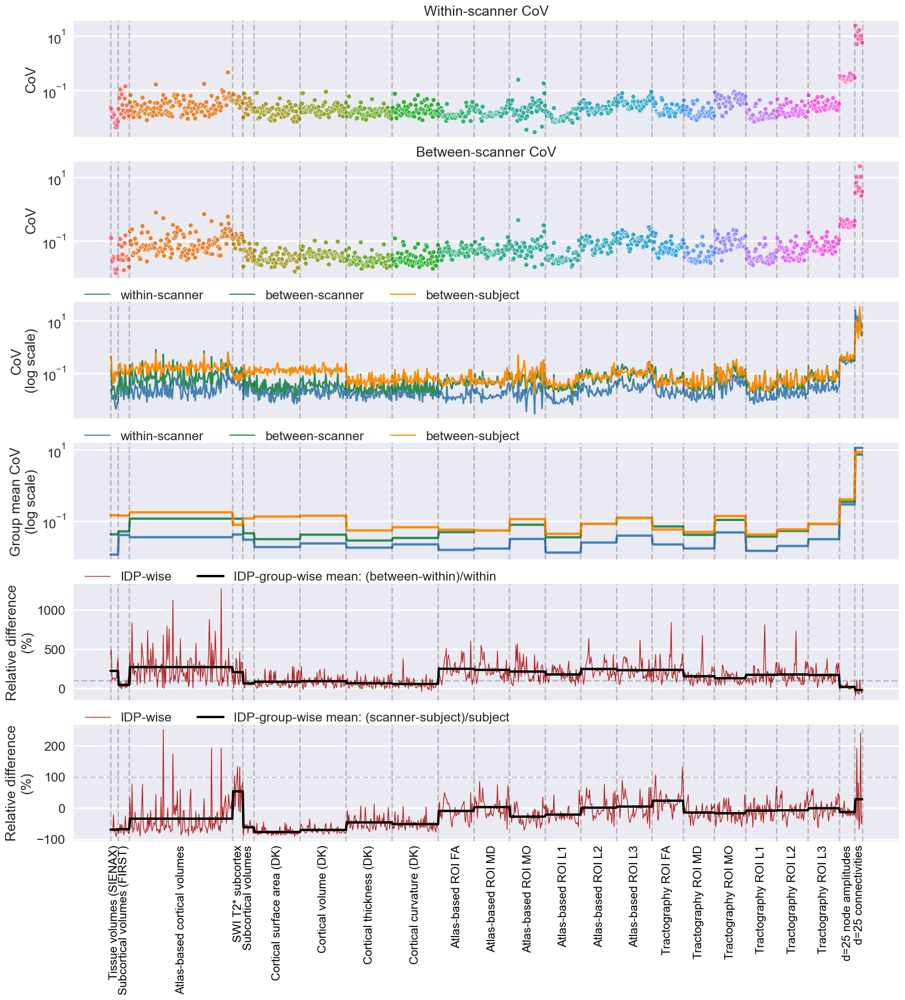

In [45]:
# IDP-wise Manhattan-style plot of CoV within/between scanners
sns.set(font_scale=1.5)
with sns.axes_style("dark"):
    fig, axes = plt.subplots(6, 1, figsize=(19, 19), sharex=True, 
                             gridspec_kw={'height_ratios': [0.6, 0.6, 0.6, 0.6, 0.6, 0.6]})
    # between-scanner
    plotdf = covdf.copy()
    plotdf.reset_index(inplace=True)
    plotdf = plotdf[plotdf.repeat_type == 'between-scanner']
    g = sns.scatterplot(data=plotdf, y="value", x="IDP", hue="IDP_type", ax=axes[1])

    g.set_ylabel("CoV");
    g.set(yscale='log');
    g.set_title('Between-scanner CoV');
    g.axhline(0, linewidth=3, color='w', linestyle="-")   
    g.legend([], [], frameon=False)
    
    # within-scanner
    plotdf = covdf.copy()
    plotdf.reset_index(inplace=True)
    plotdf = plotdf[plotdf.repeat_type == 'within-scanner']
    g = sns.scatterplot(data=plotdf, y="value", x="IDP", hue="IDP_type", ax=axes[0])

    g.set_ylabel("CoV");
    g.set(yscale='log');
    g.set_title('Within-scanner CoV');
    g.axhline(0, linewidth=3, color='w', linestyle="-")
    g.legend([], [], frameon=False)
    
    
    # log-scale lineplot
    g = sns.lineplot(data=covdf, x='IDP', y='value', hue='repeat_type', ax=axes[2], 
                     hue_order=['within-scanner', 'between-scanner', 'between-subject'], 
                     palette=['steelblue', 'seagreen', 'darkorange'], lw=2)
    g.set_ylabel("CoV\n(log scale)");
    g.set(yscale='log');
    g.legend(frameon=False, loc='upper left', ncol=3, bbox_to_anchor=(0, 0.7, 0.5, 0.5))    

    
    # log-scale IDP-group-wise mean
    covdf_with_group = covdf[covdf.repeat_type == 'within-scanner'].copy()
    covdf_with_group = get_group_stats(covdf_with_group)

    covdf_bet_group = covdf[covdf.repeat_type == 'between-scanner'].copy()
    covdf_bet_group = get_group_stats(covdf_bet_group)


    covdf_bet_sub = covdf[covdf.repeat_type == 'between-subject'].copy()
    covdf_bet_sub = get_group_stats(covdf_bet_sub)

    covdf_group = pd.concat((covdf_with_group, covdf_bet_group, covdf_bet_sub))
    g = sns.lineplot(data=covdf_group, x='IDP', y='value', hue='repeat_type', ax=axes[3], 
                     hue_order=['within-scanner', 'between-scanner', 'between-subject'], 
                     palette=['steelblue', 'seagreen', 'darkorange'], lw=3)
    g.set_ylabel("Group mean CoV\n(log scale)");
    g.set(yscale='log');
    g.legend(frameon=False, loc='upper left', ncol=3, bbox_to_anchor=(0, 0.7, 0.5, 0.5))        

    covdf_group = covdf_group[~covdf_group.duplicated(subset=['IDP_type', 'repeat_type'])].copy()
    covdf_group.to_csv(f'{fig_out}/IDP_group_means.csv')

    
    # relative difference plot
    reldiff = 100*(covdf[covdf.repeat_type == 'between-scanner'].value - 
                   covdf[covdf.repeat_type == 'within-scanner'].value) / covdf[covdf.repeat_type == 'within-scanner'].value
    reldiff = pd.DataFrame(reldiff, covdf[covdf.repeat_type == 'between-scanner'].index)
    reldiff['IDP_type'] = get_measure_type(reldiff.index)
    reldiff['measure'] = 'IDP-wise'

    reldiff_group = reldiff.copy()
    reldiff_group = get_group_stats(reldiff_group)
    
    reldiff_group['measure'] = 'IDP-group-wise mean: (between-within)/within'
    reldiff = pd.concat((reldiff, reldiff_group))
    
    reldiff_group = reldiff_group[~reldiff_group.duplicated(subset=['IDP_type'])].copy()
    reldiff.to_csv(f'{fig_out}/within-between_covdiff.csv')
    
    g = sns.lineplot(data=reldiff, x='IDP', y='value', ax=axes[4], 
                     hue='measure', palette=['firebrick', 'black'], 
                     size='measure', sizes=(3, 1))
    g.set_ylabel("Relative difference\n(%)");
    g.legend(frameon=False, loc='upper left', ncol=2, bbox_to_anchor=(0, 0.7, 0.5, 0.5))
    g.axhline(100, linewidth=2, color='black', alpha=0.2, linestyle="--")
    
    # relative difference plot (wrt biological)
    reldiff = 100*(covdf[covdf.repeat_type == 'between-scanner'].value - 
                   covdf[covdf.repeat_type == 'between-subject'].value) / covdf[covdf.repeat_type == 'between-subject'].value
    reldiff = pd.DataFrame(reldiff, covdf[covdf.repeat_type == 'between-subject'].index)
    reldiff['IDP_type'] = get_measure_type(reldiff.index)
    reldiff['measure'] = 'IDP-wise'
    
    reldiff_group = reldiff.copy()
    reldiff_group = get_group_stats(reldiff_group)
    
    reldiff_group['measure'] = 'IDP-group-wise mean: (scanner-subject)/subject'
    reldiff = pd.concat((reldiff, reldiff_group))
    reldiff_group = reldiff_group[~reldiff_group.duplicated(subset=['IDP_type'])].copy()
    reldiff.to_csv(f'{fig_out}/between-biological_covdiff.csv')
        
    g = sns.lineplot(data=reldiff, x='IDP', y='value', ax=axes[5], 
                     hue='measure', palette=['firebrick', 'black'], 
                     size='measure', sizes=(3, 1))
    g.set_ylabel("Relative difference\n(%)");
    g.legend(frameon=False, loc='upper left', ncol=2, bbox_to_anchor=(0, 0.7, 0.5, 0.5)) 
    g.axhline(100, linewidth=2, color='black', alpha=0.2, linestyle="--")
    
    # draw lines to segment IDP_types
    section_list = plotdf.IDP_type.unique()
    for ax in axes.ravel():
        ax.set_xticklabels("");
        ax.set_xlabel("");
        ax.yaxis.grid(True, which='major', color='w', linewidth=2)
        ax.axvline(0, linewidth=2, color='black', alpha=0.2, linestyle="--")
        for s in section_list:
            ind = plotdf[plotdf.IDP_type == s].index
            ax.axvline(ind[-1], linewidth=2, color='black', alpha=0.2, linestyle="--")
    
    for s in section_list:
        ind = plotdf[plotdf.IDP_type == s].index
        if g.get_ylim()[0] < 0:
            ypos = 1.1*g.get_ylim()[0]
        else:
            ypos = 0.9*g.get_ylim()[0]
            
        plt.text(np.round(np.mean(ind)), ypos, s,
                 verticalalignment='top', horizontalalignment='center', 
                 rotation=90, size='small', color='black')
    
plt.savefig(f'{fig_out}/within_between_cov.png', dpi=500, bbox_inches='tight')

### Bias
#### bias = 100 * (mean(between) - mean(within)) / mean(within)

In [49]:
bias = pd.DataFrame()
for sub, sca in zip(["13192", "14229", "14230", "14482"], ["OXF1PRI", "OXF2PRI", "OXF3TRI", "NOT1ACH"]):
    within = df[(df.subject == sub) & (df.scanner_typeloc == sca)]
    within_mn,_,_,_,_ = get_stats(within[idp_hdrs])
    
    between = df[(df.subject == sub) & (df.scan_session_num == '001')]
    between_mn,_,_,_,_ = get_stats(between[idp_hdrs])    

    measure_type = get_measure_type(between_mn.index)
    tempdf = pd.DataFrame({"subject": sub, "scanner": sca, "IDP": between_mn.index, "IDP_type": measure_type, 
                           "value": 100*(between_mn-within_mn)/between_mn})
    bias = pd.concat((bias, tempdf))
    

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2079343040.py:8: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2079343040.py:31: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/2079343040.py:31: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80

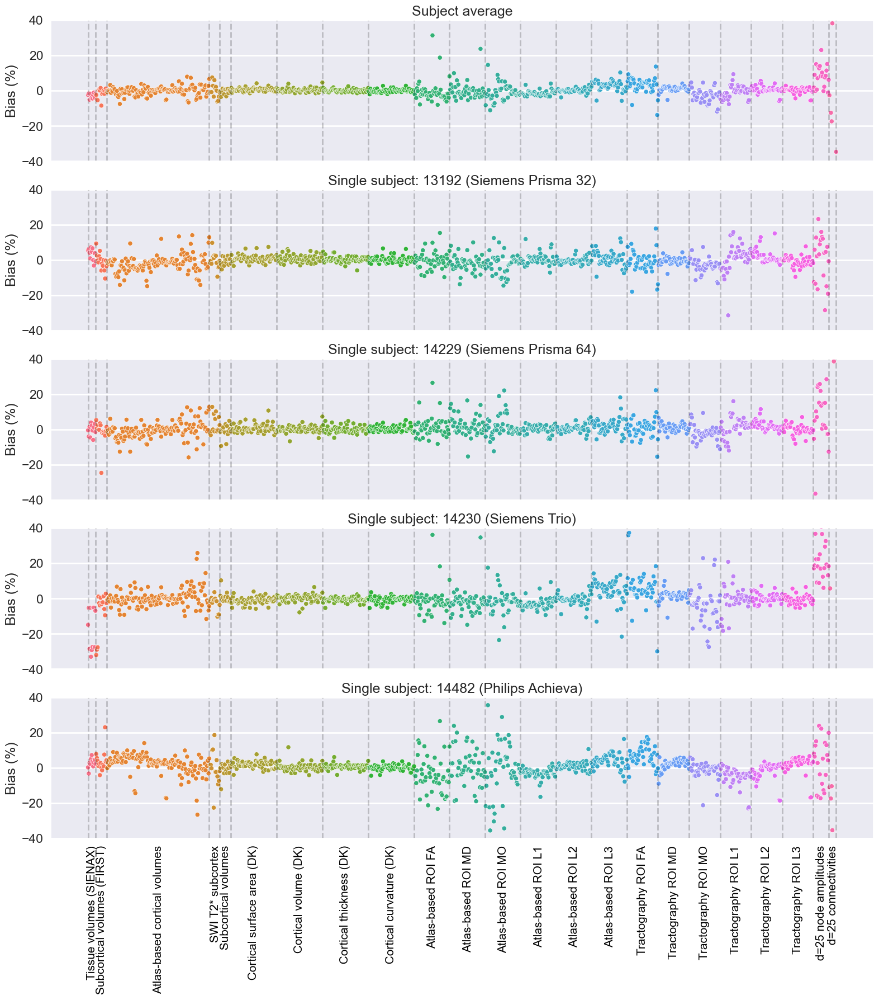

In [50]:
sns.set(font_scale=1.5)
with sns.axes_style("dark"):
    fig, axes = plt.subplots(5, 1, figsize=(19, 19), sharex=True)
    
    # all-scanner mean
    plotdf = bias.copy()
    plotdf = pd.DataFrame({"IDP": between_mn.index, "IDP_type": measure_type, 
                           "value": plotdf.groupby('IDP').mean().value.values})
    plotdf = reorder_df(plotdf)
    plotdf.replace({
                    'FSL Tissue volumes': 'Tissue volumes (SIENAX)', 
                   'FSL Subcortical volumes': 'Subcortical volumes (FIRST)', 
                   'FSL GM volumes': 'Atlas-based cortical volumes',
                   'FreeSurfer': '',
                   'dMRI tract': 'Tractography ROI',
                   'dMRI ROI': 'Atlas-based ROI',
                   'rfMRI': ''
                  }, regex=True, inplace=True)
    plotdf.reset_index(inplace=True)
    
    g = sns.scatterplot(data=plotdf, y="value", x="IDP", hue="IDP_type", ax=axes[0])
    g.set_ylabel("Bias (%)");
    g.legend([], [], frameon=False)
    g.set_ylim([-40, 40])
    g.set_title('Subject average');
    
    # single subject
    for i, (sub, sca) in enumerate(zip(["13192", "14229", "14230", "14482"], ["OXF1PRI", "OXF2PRI", "OXF3TRI", "NOT1ACH"])):
        plotdf = bias[bias.subject == sub].copy()
        plotdf = pd.DataFrame({"IDP": between_mn.index, "IDP_type": measure_type, 
                               "value": plotdf.groupby('IDP').mean().value.values})
        plotdf = reorder_df(plotdf)
        plotdf.replace({
                        'FSL Tissue volumes': 'Tissue volumes (SIENAX)', 
                       'FSL Subcortical volumes': 'Subcortical volumes (FIRST)', 
                       'FSL GM volumes': 'Atlas-based cortical volumes',
                       'FreeSurfer': '',
                       'dMRI tract': 'Tractography ROI',
                       'dMRI ROI': 'Atlas-based ROI',
                       'rfMRI': ''
                      }, regex=True, inplace=True)
        plotdf.reset_index(inplace=True)
        g = sns.scatterplot(data=plotdf, y="value", x="IDP", hue="IDP_type", ax=axes[i+1])
        g.set_ylabel("Bias (%)");
        g.legend([], [], frameon=False)
        g.set_ylim([-40, 40])
        g.set_title(f'Single subject: {sub} ({scanner_dict[sca]})');
    
    # draw lines to segment IDP_types
    section_list = plotdf.IDP_type.unique()
    for ax in axes.ravel():
        ax.set_xticklabels("");
        ax.set_xlabel("");
        ax.yaxis.grid(True, which='major', color='w', linewidth=2)
        ax.axvline(0, linewidth=2, color='black', alpha=0.2, linestyle="--")
        for s in section_list:
            ind = plotdf[plotdf.IDP_type == s].index
            ax.axvline(ind[-1], linewidth=2, color='black', alpha=0.2, linestyle="--")
    
    for s in section_list:
        ind = plotdf[plotdf.IDP_type == s].index
        if g.get_ylim()[0] < 0:
            ypos = 1.1*g.get_ylim()[0]
        else:
            ypos = 0.9*g.get_ylim()[0]
            
        plt.text(np.round(np.mean(ind)), ypos, s,
                 verticalalignment='top', horizontalalignment='center', 
                 rotation=90, size='small', color='black')

plt.savefig(f'{fig_out}/scanner_bias.png', dpi=500, bbox_inches='tight')

In [51]:
bias['value'] = bias['value'].abs()
bias.groupby(['IDP_type']).mean()

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/1772842573.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,value
IDP_type,
FSL GM volumes,5.766660
FSL Subcortical volumes,3.214296
FSL Tissue volumes,2.405067
FreeSurfer Cortical curvature (DK),1.513932
FreeSurfer Cortical surface area (DK),1.188286
FreeSurfer Cortical thickness (DK),1.266268
FreeSurfer Cortical volume (DK),1.839395
FreeSurfer Subcortical volumes,2.147829
SWI T2* subcortex,7.534578


### IDP-wise ranking consistency

In [52]:
# for each IDP, rank the subject across scanners
# then correlate the ranking (or just Spearman with sc.stats.spearmanr)
corrdf = []
for j, h in enumerate(idp_hdrs):
    arr = np.zeros((len(sub_list), len(scanner_typeloc_list)))
    for i, sca in enumerate(scanner_typeloc_list):
        arr[:, i] = df[(df.scan_session_num == '001') & (df.scanner_typeloc == sca)][h]

    corr = sc.stats.spearmanr(arr, axis=0, nan_policy='omit')[0]
    corr = corr[np.triu_indices_from(corr, k=1)]
    corrdf.append(np.mean(corr))
    
corrdf = pd.DataFrame({'IDP':idp_hdrs, 'correlation':corrdf})
measure_type = get_measure_type(corrdf.IDP)
corrdf['IDP_type'] = measure_type
corrdf['scanners'] = 'All scanners'

# Siemens only
corrdf_sie = []
siemens_list = ['OXF1PRI', 'OXF2PRI', 'OXF3TRI']
for j, h in enumerate(idp_hdrs):
    arr = np.zeros((len(sub_list), len(siemens_list)))
    for i, sca in enumerate(siemens_list):
        arr[:, i] = df[(df.scan_session_num == '001') & (df.vendor == 'Siemens') & (df.scanner_typeloc == sca)][h]

    corr = sc.stats.spearmanr(arr, axis=0, nan_policy='omit')[0]
    corr = corr[np.triu_indices_from(corr, k=1)]
    
    corrdf_sie.append(np.mean(corr))
    
corrdf_sie = pd.DataFrame({'IDP':idp_hdrs, 'correlation':corrdf_sie})
measure_type = get_measure_type(corrdf_sie.IDP)
corrdf_sie['IDP_type'] = measure_type
corrdf_sie['scanners'] = 'Siemens only'


<Figure size 1600x400 with 0 Axes>

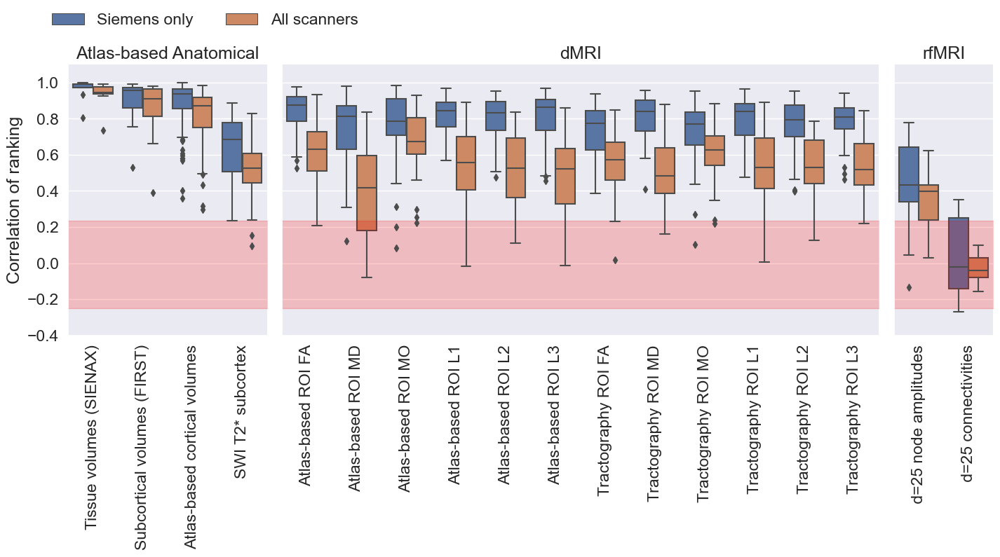

In [53]:
# IDP-category-wise box plots
plotdf = pd.concat((reorder_df(corrdf), reorder_df(corrdf_sie)))

plotdf = plotdf[plotdf['IDP_type'].str.contains('FreeSurfer')==False]

plotdf['IDP_cat'] = plotdf['IDP_type']
plotdf.loc[plotdf['IDP_cat'].str.contains('FreeSurfer'), 'IDP_cat'] = 'FreeSurfer Anatomical'
plotdf.loc[plotdf['IDP_cat'].str.contains('FSL'), 'IDP_cat'] = 'Atlas-based Anatomical'
plotdf.loc[plotdf['IDP_cat'].str.contains('SWI'), 'IDP_cat'] = 'Atlas-based Anatomical'
plotdf.loc[plotdf['IDP_cat'].str.contains('dMRI'), 'IDP_cat'] = 'dMRI'
plotdf.loc[plotdf['IDP_cat'].str.contains('rfMRI'), 'IDP_cat'] = 'rfMRI'

# replace names for display
plotdf['IDP_type'] = plotdf['IDP_type'].replace({
               'FSL Tissue volumes': 'Tissue volumes (SIENAX)', 
               'FSL Subcortical volumes': 'Subcortical volumes (FIRST)', 
               'FSL GM volumes': 'Atlas-based cortical volumes',
               'FreeSurfer': '',
               'dMRI tract': 'Tractography ROI',
               'dMRI ROI': 'Atlas-based ROI',
               'rfMRI': ''
              }, regex=True)


sns.set(font_scale=1.5)
plt.figure(figsize=(16, 4))
widths = [0.05*len(plotdf[plotdf.IDP_cat == h].IDP_type.unique()) for h in plotdf.IDP_cat.unique()]
g = sns.catplot(data=plotdf, x='IDP_type', y='correlation', hue='scanners', 
                hue_order=['Siemens only', 'All scanners'], col='IDP_cat', kind='box',
                facet_kws={'gridspec_kws': {'width_ratios': widths}},
                sharey=True, sharex=False, legend=False)

g.set_xticklabels(rotation=90);
g.set_xlabels('');
g.set_ylabels('Correlation of ranking');
g.set_titles(col_template="{col_name}", fontsize=8);
plt.subplots_adjust(wspace=0.05)
# g.add_legend(frameon=False, loc='center left', bbox_to_anchor=(0.09, 0.15), ncol=2)
g.add_legend(frameon=False, loc='center left', bbox_to_anchor=(0.06, 1.02), ncol=2)

g.set(ylim=(-0.4, 1.1))
get_null_corr(g)

plt.savefig(f'{fig_out}/ranking_corr.png', dpi=500, bbox_inches='tight')

## Supplementary between-session correlation matrix figure

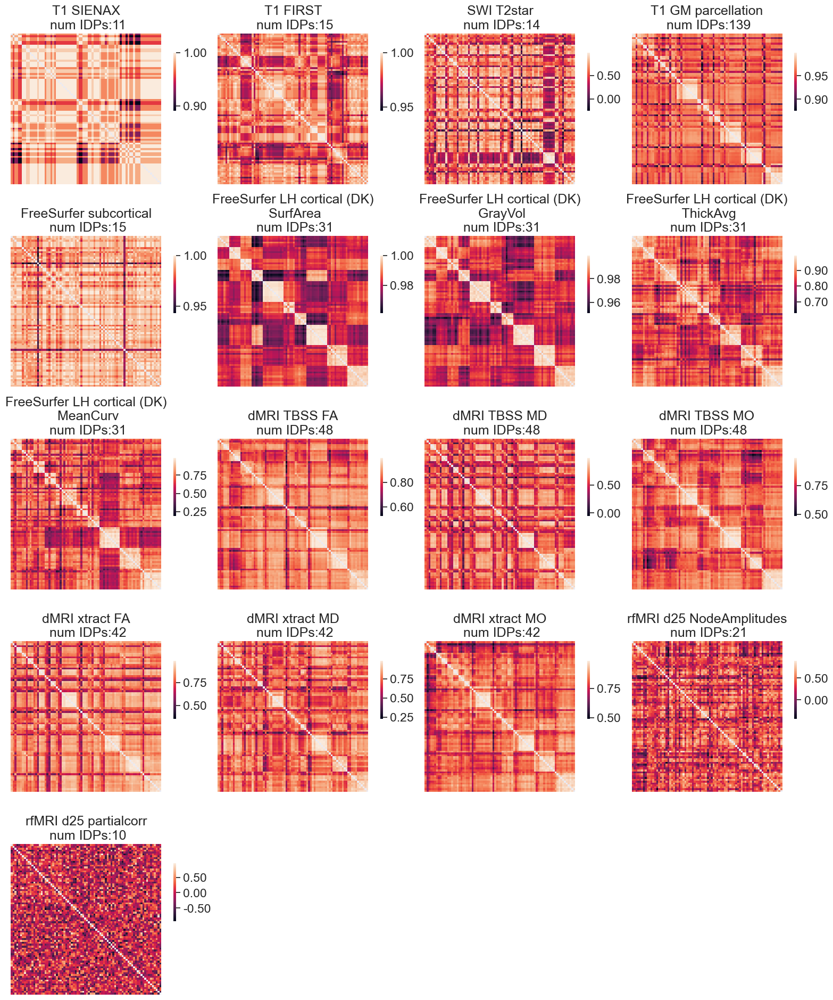

In [54]:
## loop through IDP_types
IDP_groups = ['T1_SIENAX', 'T1_FIRST', 'SWI_T2star', 'T1_GM_parcellation',
              'freesurfer_aseg', 
              'freesurfer_lh.aparc.DKTatlas_SurfArea',
              'freesurfer_lh.aparc.DKTatlas_GrayVol',
              'freesurfer_lh.aparc.DKTatlas_ThickAvg',
              'freesurfer_lh.aparc.DKTatlas_MeanCurv',  
              'dMRI_TBSS_FA', 'dMRI_TBSS_MD', 'dMRI_TBSS_MO',
              'dMRI_xtract_FA', 'dMRI_xtract_MD', 'dMRI_xtract_MO',
              'rfMRI_d25_NodeAmplitudes', 'rfMRI_d25_partialcorr'
             ]


ncol = 4
nrow = int(np.ceil(len(IDP_groups) / ncol))
fig, axs = plt.subplots(nrows=nrow, ncols=ncol, figsize=(4*ncol, 4*nrow))

all_corrmat = np.zeros((df.shape[0], df.shape[0], len(IDP_groups)))
for i, (h, ax) in enumerate(zip(IDP_groups, axs.ravel())):
    if 'rfMRI' in h:
        idp_hdrs = [k for k in fmri_top5_idp_list if h in k]
    else:
        idp_hdrs = list(df.filter(regex=h).columns.values)
        
    corrmat, reptdf_sort, sorted_df = bigcorr(df[info_hdrs + idp_hdrs])

    g = sns.heatmap(corrmat, linewidth=0, xticklabels=False, yticklabels=False, #vmin=vmin, vmax=vmax,
                cbar=True, cbar_kws=dict(use_gridspec=True, location="right", format='%.2f',
                                         shrink=0.3, anchor=(0.1,0.7)), 
                    square=True, ax=ax)
    h = h.replace('_', ' ')
    h = h.replace('freesurfer', 'FreeSurfer')
    h = h.replace('aseg', 'subcortical')
    h = h.replace('lh.', 'LH ')
    h = h.replace('rh.', 'RH ')
    h = h.replace('aparc.DKTatlas', 'cortical (DK)\n')
    h = h.replace('aparc.a2009s', 'cortical (Destrieux)\n')
    
    h = h + '\n num IDPs:' + str(len(idp_hdrs))
    
    ax.title.set_text(h)
    g.set_xlabel('')
    g.set_ylabel('')
    
    all_corrmat[:, :, i] = corrmat.values
    
plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.05)

for i, ax in enumerate(axs.ravel()):
    if i >= len(IDP_groups):
        fig.delaxes(ax)


### Repeat CoV after regression of scan delays and age

In [55]:
# load CSV with subject DOB, sex and scan dates
df_dates = pd.read_csv(f'{studydir}/data/scan_dates.csv', index_col=None, dtype='str')

# create new temp main df with first scans only (i.e. no including within-scanner repeats)
df_lme = df.copy()

# add df_dates info to new main dataframe
df_lme.insert(1, 'sex', [df_dates.loc[df_dates['Subjects'] == s, 'Sex'].iloc[0] for s in df_lme.subject.values])
df_lme.insert(1, 'DOB', [df_dates.loc[df_dates['Subjects'] == s, 'DOB'].iloc[0] for s in df_lme.subject.values])

scan_date_list = []
for sub,sca in zip(df_lme.subject.values, df_lme.scanner_code.values):
    scan_date_list.append(df_dates.loc[df_dates['Subjects'] == sub, sca].iloc[0])
    
df_lme.insert(1, 'scan_date', scan_date_list)

# age at scan
from datetime import datetime
scan_age_list = []
for scan_date, DOB in zip(df_lme.scan_date.values, df_lme.DOB.values):
    delta = datetime.strptime(scan_date, '%d/%m/%Y') - datetime.strptime(DOB, '%d/%m/%Y')
    scan_age_list.append(delta.days/365.25)

df_lme.insert(1, 'scan_age_years', scan_age_list)

# delay relative to first scan
delay_list = []
for index, row in df_lme.iterrows():
    s = row["subject"]
    delay_list.append(row.scan_age_years - df_lme[df_lme.subject == s]['scan_age_years'].min())
    
df_lme.insert(1, 'delay', delay_list)  


### Estimate betas
#### Y = A.B
#### B_hat = pinv(A).Y
#### Y_r = Y - A.B_hat


#### Y(Nx1) is a vector of IDPs across sessions (60)
#### A(NxM) are the vectors of demeaned regression parameters (e.g. subject age, scan delays)
#### B(Nx1) is the vector of betas
#### B_hat is the estimates of the betas
#### Y_r is the beta regressed IDP vector

In [59]:
# perform confound regression
df_regress = df_lme.copy()

A = df_regress[['scan_age_years', 'delay']] # the regressors
A = A.sub(A.mean()) # demeaned regressors

for h in idp_hdrs:
    B_hat = np.dot(np.linalg.pinv(A), df_regress[h].fillna(0))
    df_regress[h] = df_regress[h] - np.dot(A, B_hat)


In [60]:
# now calculate between scanner and between subject CoVs, and the relative difference for plotting
idp_hdrs = list(df_lme.filter(regex='T1_|T2_FLAIR|SWI_|aseg|DKTatlas|dMRI_TBSS|dMRI_xtract').columns.values)
idp_hdrs = idp_hdrs + fmri_top5_idp_list

between_cov, between_sub = pd.DataFrame(), pd.DataFrame()
for sub in sub_list:    
    # between-scanner
    tempdf = df_regress[(df_regress.subject == sub) & (df_regress.scan_session_num == '001')]
    mn, med, mad, cv, mad_med = get_stats(tempdf[idp_hdrs])
    measure_type = get_measure_type(cv.index)
    tempdf = pd.DataFrame({"subject": sub, "IDP": cv.index, "value": cv, "IDP_type": measure_type})
    between_cov = pd.concat((between_cov, tempdf))
    
for sca in scanner_typeloc_list: 
    # between-subject
    tempdf = df_regress[(df_regress.scanner_typeloc == sca) & (df_regress.scan_session_num == '001')]
    mn, med, mad, cv, mad_med = get_stats(tempdf[idp_hdrs])
    measure_type = get_measure_type(cv.index)
    tempdf = pd.DataFrame({"subject": 'all', 'scanner': sca, "IDP": cv.index, "value": cv, "IDP_type": measure_type})
    between_sub = pd.concat((between_sub, tempdf))   
    
# average across subjects
between_cov = between_cov.groupby('IDP').mean()
measure_type = get_measure_type(between_cov.index)
between_cov["IDP_type"] = measure_type

between_sub = between_sub.groupby('IDP').mean()
measure_type = get_measure_type(between_sub.index)
between_sub["IDP_type"] = measure_type

# prepare for plotting
between_cov['repeat_type'] = 'between-scanner'
between_sub['repeat_type'] = 'between-subject'
covdf = pd.concat((reorder_df(between_cov), reorder_df(between_sub)))
covdf.replace({
                'FSL Tissue volumes': 'Tissue volumes (SIENAX)', 
               'FSL Subcortical volumes': 'Subcortical volumes (FIRST)', 
               'FSL GM volumes': 'Atlas-based cortical volumes',
               'FreeSurfer': '',
               'dMRI tract': 'Tractography ROI',
               'dMRI ROI': 'Atlas-based ROI',
               'rfMRI': ''
              }, regex=True, inplace=True)

# calculate the relative difference between between-scanner and between-subject CoV
regressed_reldiff = 100*(covdf[covdf.repeat_type == 'between-scanner'].value - 
               covdf[covdf.repeat_type == 'between-subject'].value) / covdf[covdf.repeat_type == 'between-subject'].value
regressed_reldiff = pd.DataFrame(regressed_reldiff, covdf[covdf.repeat_type == 'between-subject'].index)
regressed_reldiff['IDP_type'] = get_measure_type(regressed_reldiff.index)
regressed_reldiff['measure'] = 'IDP-wise (subject age/scan delay regressed out)'

regressed_reldiff_group = regressed_reldiff.copy()
regressed_reldiff_group = get_group_stats(regressed_reldiff_group)

regressed_reldiff_group['measure'] = 'IDP-group-wise mean (subject age/scan delay regressed out)'
regressed_reldiff = pd.concat((regressed_reldiff, regressed_reldiff_group))
regressed_reldiff_group = regressed_reldiff_group[~regressed_reldiff_group.duplicated(subset=['IDP_type'])].copy()

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/4143685819.py:24: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/4143685819.py:28: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [61]:
# re-calculate the CoVs for the original (no regression version) - just to make sure we don't mess things up...
idp_hdrs = list(df.filter(regex='T1_|T2_FLAIR|SWI_|aseg|DKTatlas|dMRI_TBSS|dMRI_xtract').columns.values)
idp_hdrs = idp_hdrs + fmri_top5_idp_list

between_cov, between_sub = pd.DataFrame(), pd.DataFrame()
for sub in sub_list:    
    # between-scanner
    tempdf = df[(df.subject == sub) & (df.scan_session_num == '001')]
    mn, med, mad, cv, mad_med = get_stats(tempdf[idp_hdrs])
    measure_type = get_measure_type(cv.index)
    tempdf = pd.DataFrame({"subject": sub, "IDP": cv.index, "value": cv, "IDP_type": measure_type})
    between_cov = pd.concat((between_cov, tempdf))
    
for sca in scanner_typeloc_list: 
    # between-subject
    tempdf = df[(df.scanner_typeloc == sca) & (df.scan_session_num == '001')]
    mn, med, mad, cv, mad_med = get_stats(tempdf[idp_hdrs])
    measure_type = get_measure_type(cv.index)
    tempdf = pd.DataFrame({"subject": 'all', 'scanner': sca, "IDP": cv.index, "value": cv, "IDP_type": measure_type})
    between_sub = pd.concat((between_sub, tempdf))   
    
# average across subjects
between_cov = between_cov.groupby('IDP').mean()
measure_type = get_measure_type(between_cov.index)
between_cov["IDP_type"] = measure_type

between_sub = between_sub.groupby('IDP').mean()
measure_type = get_measure_type(between_sub.index)
between_sub["IDP_type"] = measure_type

# prepare for plotting
between_cov['repeat_type'] = 'between-scanner'
between_sub['repeat_type'] = 'between-subject'
covdf = pd.concat((reorder_df(between_cov), reorder_df(between_sub)))
covdf.replace({
                'FSL Tissue volumes': 'Tissue volumes (SIENAX)', 
               'FSL Subcortical volumes': 'Subcortical volumes (FIRST)', 
               'FSL GM volumes': 'Atlas-based cortical volumes',
               'FreeSurfer': '',
               'dMRI tract': 'Tractography ROI',
               'dMRI ROI': 'Atlas-based ROI',
               'rfMRI': ''
              }, regex=True, inplace=True)

# calculate the relative difference between between-scanner and between-subject CoV
reldiff = 100*(covdf[covdf.repeat_type == 'between-scanner'].value - 
               covdf[covdf.repeat_type == 'between-subject'].value) / covdf[covdf.repeat_type == 'between-subject'].value
reldiff = pd.DataFrame(reldiff, covdf[covdf.repeat_type == 'between-subject'].index)
reldiff['IDP_type'] = get_measure_type(reldiff.index)
reldiff['measure'] = 'IDP-wise (no regression)'

reldiff_group = reldiff.copy()
reldiff_group = get_group_stats(reldiff_group)

reldiff_group['measure'] = 'IDP-group-wise mean (no regression)'
reldiff = pd.concat((reldiff, reldiff_group))
reldiff_group = reldiff_group[~reldiff_group.duplicated(subset=['IDP_type'])].copy()
reldiff = reldiff.reset_index(names='IDP')

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/426371499.py:23: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/zl/1dgn0f017lj2m5zffnwkcyr80000gq/T/ipykernel_391/426371499.py:27: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



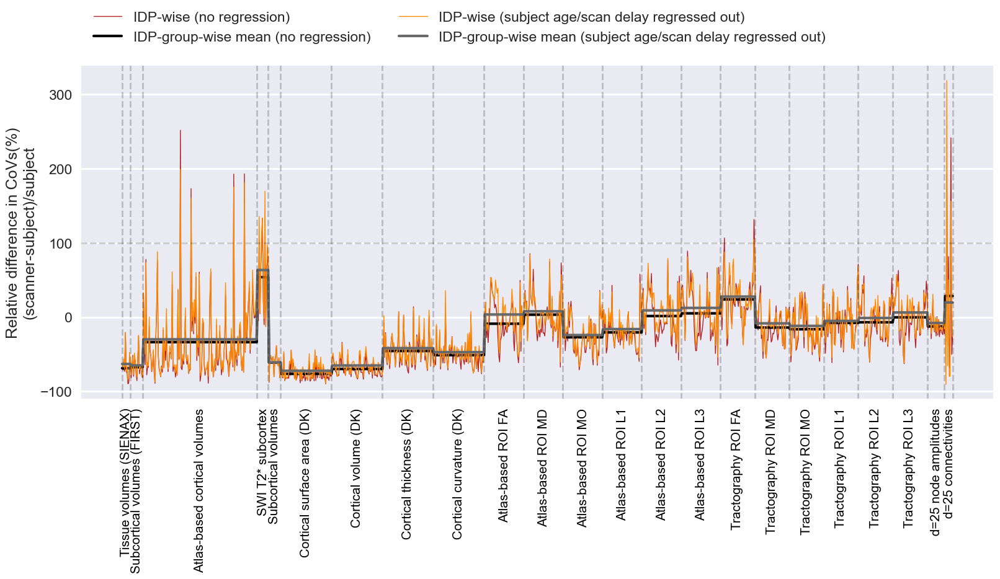

In [62]:
# IDP-wise Manhattan-style plot of CoV within/between scanners
sns.set(font_scale=1.5)
with sns.axes_style("dark"):
    fig = plt.figure(figsize=(19, 7))
    
    # the original plot (without confound regression)
    g = sns.lineplot(data=reldiff, x='IDP', y='value', 
                     hue='measure', palette=['firebrick', 'black'], 
                     size='measure', sizes=(3, 1))
    
    
    # relative difference plot (wrt biological) following confound (subject age and scan delay) regression
    g = sns.lineplot(data=regressed_reldiff, x='IDP', y='value', 
                     hue='measure', palette=['darkorange', 'dimgray'], 
                     size='measure', sizes=(3, 1))
    
    g.set_ylabel("Relative difference in CoVs(%)\n(scanner-subject)/subject");
    g.legend(frameon=False, loc='upper left', ncol=2, bbox_to_anchor=(0, 0.7, 0.5, 0.5)) 
    g.axhline(100, linewidth=2, color='black', alpha=0.2, linestyle="--")

    plotdf = covdf.copy()
    plotdf.reset_index(inplace=True)
    plotdf = plotdf[plotdf.repeat_type == 'between-scanner']
    
    # draw lines to segment IDP_types
    section_list = plotdf.IDP_type.unique()
    
    g.set_xticklabels("");
    g.set_xlabel("");
    g.yaxis.grid(True, which='major', color='w', linewidth=2)
    g.axvline(0, linewidth=2, color='black', alpha=0.2, linestyle="--")
    for s in section_list:
        ind = plotdf[plotdf.IDP_type == s].index
        g.axvline(ind[-1], linewidth=2, color='black', alpha=0.2, linestyle="--")
    
    for s in section_list:
        ind = plotdf[plotdf.IDP_type == s].index
        if g.get_ylim()[0] < 0:
            ypos = 1.1*g.get_ylim()[0]
        else:
            ypos = 0.9*g.get_ylim()[0]
            
        plt.text(np.round(np.mean(ind)), ypos, s,
                 verticalalignment='top', horizontalalignment='center', 
                 rotation=90, size='small', color='black')
    
plt.savefig(f'{fig_out}/within_between_cov_regress.png', dpi=500, bbox_inches='tight')